#import

In [ ]:
import numpy as np
import pandas as pd
from tqdm import tqdm
import cv2

import os
from sklearn.model_selection import train_test_split
from PIL import Image
import os
from sklearn.metrics import auc,roc_auc_score
import time
import matplotlib.pyplot as plt


import torch
import torch.nn as nn
import torch.nn.functional as F
from torch.utils.data import DataLoader,Dataset
from torchvision import datasets, transforms, models
import torchvision.utils as utils
# device = torch.device("cpu")

import warnings
warnings.filterwarnings("ignore")
from __future__ import print_function
from __future__ import division
import imgaug
import torch
import torch.nn as nn
import torch.optim as optim
import numpy as np
from PIL import Image
import torchvision
from torchvision import datasets, models, transforms
from torch.utils.data import Dataset, DataLoader
from torchsummary import summary
import matplotlib.pyplot as plt
import time
import shutil
import os
import random
import copy
from sklearn.metrics import confusion_matrix, ConfusionMatrixDisplay
from sklearn.metrics import average_precision_score, roc_auc_score, precision_score, recall_score
import torchvision.utils as utils

print("PyTorch Version: ",torch.__version__)
print("Torchvision Version: ",torchvision.__version__)

PyTorch Version:  2.1.0+cu121
Torchvision Version:  0.16.0+cu121


In [ ]:
! pip install -q kaggle
from google.colab import files
files.upload()

Saving kaggle.json to kaggle.json


{'kaggle.json': b'{"username":"afsh1r","key":"da47acc2cbeb267b594df68dd323d04a"}'}

In [ ]:
!rm -r ~/.kaggle
!mkdir ~/.kaggle
!mv ./kaggle.json ~/.kaggle/
!chmod 600 ~/.kaggle/kaggle.json

In [ ]:
!kaggle datasets download -d paultimothymooney/chest-xray-pneumonia

100% 2.29G/2.29G [01:26<00:00, 30.7MB/s]
100% 2.29G/2.29G [01:26<00:00, 28.5MB/s]


In [ ]:
# import os
# import shutil

# data_dir = '/content/Brain-Tumor-Classification-DataSet/Trainig'

# # Specify the folder you want to remove
# folder_to_remove = '/content/Brain-Tumor-Classification-DataSet/Training/no_tumor'
# folder_path = os.path.join(data_dir, folder_to_remove)

# # Check if the folder exists before removing it
# if os.path.exists(folder_path):
#     shutil.rmtree(folder_path)
#     print(f"The '{folder_to_remove}' folder has been successfully removed from {data_dir}.")
# else:
#     print(f"The '{folder_to_remove}' folder does not exist in {data_dir}.")


The '/content/Brain-Tumor-Classification-DataSet/Training/no_tumor' folder has been successfully removed from /content/Brain-Tumor-Classification-DataSet/Trainig.


In [ ]:
# import os
# import shutil

# data_dir = '/content/Brain-Tumor-Classification-DataSet/Testing'

# # Specify the folder you want to remove
# folder_to_remove = '/content/Brain-Tumor-Classification-DataSet/Testing/no_tumor'
# folder_path = os.path.join(data_dir, folder_to_remove)

# # Check if the folder exists before removing it
# if os.path.exists(folder_path):
#     shutil.rmtree(folder_path)
#     print(f"The '{folder_to_remove}' folder has been successfully removed from {data_dir}.")
# else:
#     print(f"The '{folder_to_remove}' folder does not exist in {data_dir}.")


The '/content/Brain-Tumor-Classification-DataSet/Testing/no_tumor' folder has been successfully removed from /content/Brain-Tumor-Classification-DataSet/Testing.


In [ ]:
np.random.seed(42)
torch.manual_seed(42)
torch.cuda.manual_seed(42)
device = torch.device('cuda' if torch.cuda.is_available() else 'cpu')
print(device)

cuda


In [ ]:
!unzip /content/chest-xray-pneumonia.zip

Streaming output truncated to the last 5000 lines.
  inflating: chest_xray/train/NORMAL/IM-0435-0001-0001.jpeg  
  inflating: chest_xray/train/NORMAL/IM-0435-0001.jpeg  
  inflating: chest_xray/train/NORMAL/IM-0437-0001-0001.jpeg  
  inflating: chest_xray/train/NORMAL/IM-0437-0001-0002.jpeg  
  inflating: chest_xray/train/NORMAL/IM-0437-0001.jpeg  
  inflating: chest_xray/train/NORMAL/IM-0438-0001.jpeg  
  inflating: chest_xray/train/NORMAL/IM-0439-0001-0001.jpeg  
  inflating: chest_xray/train/NORMAL/IM-0439-0001-0002.jpeg  
  inflating: chest_xray/train/NORMAL/IM-0439-0001.jpeg  
  inflating: chest_xray/train/NORMAL/IM-0440-0001.jpeg  
  inflating: chest_xray/train/NORMAL/IM-0441-0001.jpeg  
  inflating: chest_xray/train/NORMAL/IM-0442-0001.jpeg  
  inflating: chest_xray/train/NORMAL/IM-0444-0001.jpeg  
  inflating: chest_xray/train/NORMAL/IM-0445-0001.jpeg  
  inflating: chest_xray/train/NORMAL/IM-0446-0001.jpeg  
  inflating: chest_xray/train/NORMAL/IM-0447-0001.jpeg  
  inflating:

#dataset

In [ ]:
from torchvision import transforms

transform = transforms.Compose([
    transforms.Resize((224, 224)),  # Adjust the crop size as needed
    transforms.ToTensor(),
    transforms.Normalize(mean=[0.485, 0.456, 0.406],
                         std=[0.229, 0.224, 0.225])
])

In [ ]:
# data_dir = '/content/Brain-Tumor-Classification-DataSet/Training'

# # Merge tumor classes into one category 'tumor' and keep 'no_tumor' unchanged
# classes = ['glioma_tumor', 'meningioma_tumor', 'pituitary_tumor', 'no_tumor']

# # Create a new folder structure to merge tumor classes into 'tumor'
# new_data_dir = '/content/Training'
# os.makedirs(new_data_dir, exist_ok=True)

# for class_name in classes:
#     class_path = os.path.join(data_dir, class_name)
#     if class_name != 'no_tumor':
#         for img_file in os.listdir(class_path):
#             img_path = os.path.join(class_path, img_file)
#             new_img_path = os.path.join(new_data_dir, 'tumor', img_file)
#             os.makedirs(os.path.join(new_data_dir, 'tumor'), exist_ok=True)
#             os.rename(img_path, new_img_path)
#     else:
#         no_tumor_path = os.path.join(new_data_dir, 'no_tumor')
#         os.makedirs(no_tumor_path, exist_ok=True)
#         for img_file in os.listdir(class_path):
#             img_path = os.path.join(class_path, img_file)
#             new_img_path = os.path.join(no_tumor_path, img_file)
#             os.rename(img_path, new_img_path)

In [ ]:
# data_dir = '/content/Brain-Tumor-Classification-DataSet/Testing'

# # Merge tumor classes into one category 'tumor' and keep 'no_tumor' unchanged
# classes = ['glioma_tumor', 'meningioma_tumor', 'pituitary_tumor', 'no_tumor']

# # Create a new folder structure to merge tumor classes into 'tumor'
# new_data_dir = '/content/Testing'
# os.makedirs(new_data_dir, exist_ok=True)

# for class_name in classes:
#     class_path = os.path.join(data_dir, class_name)
#     if class_name != 'no_tumor':
#         for img_file in os.listdir(class_path):
#             img_path = os.path.join(class_path, img_file)
#             new_img_path = os.path.join(new_data_dir, 'tumor', img_file)
#             os.makedirs(os.path.join(new_data_dir, 'tumor'), exist_ok=True)
#             os.rename(img_path, new_img_path)
#     else:
#         no_tumor_path = os.path.join(new_data_dir, 'no_tumor')
#         os.makedirs(no_tumor_path, exist_ok=True)
#         for img_file in os.listdir(class_path):
#             img_path = os.path.join(class_path, img_file)
#             new_img_path = os.path.join(no_tumor_path, img_file)
#             os.rename(img_path, new_img_path)

In [ ]:
# get data
train_data = torchvision.datasets.ImageFolder("/content/chest_xray/chest_xray/train", transform=transform)
test_data = torchvision.datasets.ImageFolder("/content/chest_xray/chest_xray/test", transform=transform)

val_data = torchvision.datasets.ImageFolder("/content/chest_xray/chest_xray/val", transform=transform)

print(f'train dataset len : {len(train_data)}')
print(f"test dataset len: {len(test_data)}")
print(f"test dataset len: {len(val_data)}")


train dataset len : 5216
test dataset len: 624
test dataset len: 16


In [ ]:
# data loaders
# Create data loaders for our datasets; shuffle for training, not for validation
batch_size_train=32
batch_size_test=64

# from torch.utils.data import random_split

# dataset_size = len(train_data)
# val_size = int(0.2 * dataset_size)
# train_size = dataset_size - val_size
# Split the dataset into train and validation sets
# train_dataset, val_dataset = random_split(train_data, [train_size, val_size])

# print(len(train_dataset), len(val_dataset))
# print(len(test_data))

# Create data loaders for train and validation sets
training_loader = DataLoader(train_data, batch_size=batch_size_train, shuffle=True)
validation_loader = DataLoader(val_data, batch_size=batch_size_test, shuffle=False)

test_loader = DataLoader(test_data, batch_size=batch_size_test, shuffle=False)

In [ ]:
data_loaders = {'train': training_loader, 'val': validation_loader}

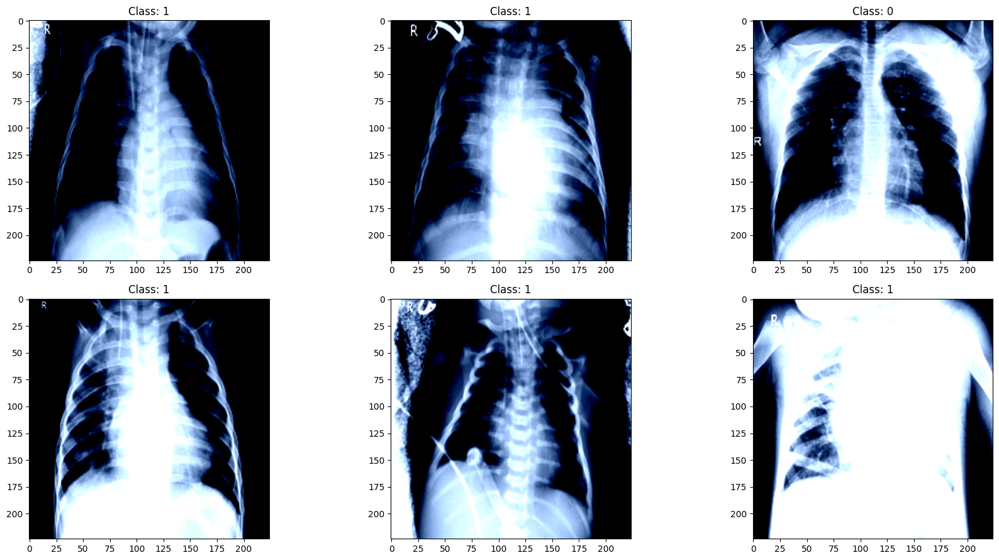

In [ ]:
import matplotlib.pyplot as plt
import numpy as np

# Assuming `training_loader` is your DataLoader for the training dataset

# Get a batch of data
for batch in training_loader:
    images, labels = batch  # Extract images and labels from the batch
    fig, axes = plt.subplots(2, 3, figsize=(18, 9))

    # Plot the images and print class labels
    for i in range(6):  # Plot 6 images from the batch
        row = i // 3  # Calculate the row index in the subplot grid
        col = i % 3   # Calculate the column index in the subplot grid

        # Display the image
        image = np.array(images[i].permute(1, 2, 0))  # Convert PyTorch tensor to NumPy array and rearrange dimensions
        axes[row, col].imshow(image)
        axes[row, col].set_title(f"Class: {labels[i].item()}")  # Print class label as the title

    plt.tight_layout()
    plt.show()
    break  # Break after displaying the first batch


In [ ]:
class_names = train_data.classes
class_names

['NORMAL', 'PNEUMONIA']

#model

In [ ]:
class AttentionBlock(nn.Module):
    def __init__(self, in_features_l, in_features_g, attn_features, up_factor, normalize_attn=True):
        super(AttentionBlock, self).__init__()
        self.up_factor = up_factor
        self.normalize_attn = normalize_attn
        self.W_l = nn.Conv2d(in_channels=in_features_l, out_channels=attn_features, kernel_size=1, padding=0, bias=False)
        self.W_g = nn.Conv2d(in_channels=in_features_g, out_channels=attn_features, kernel_size=1, padding=0, bias=False)
        self.phi = nn.Conv2d(in_channels=attn_features, out_channels=1, kernel_size=1, padding=0, bias=True)
    def forward(self, l, g):
        N, C, W, H = l.size()
        l_ = self.W_l(l)
        g_ = self.W_g(g)
        if self.up_factor > 1:
            g_ = F.interpolate(g_, scale_factor=self.up_factor, mode='bilinear', align_corners=False)
        c = self.phi(F.relu(l_ + g_)) # batch_sizex1xWxH

        # compute attn map
        if self.normalize_attn:
            a = F.softmax(c.view(N,1,-1), dim=2).view(N,1,W,H)
        else:
            a = torch.sigmoid(c)
        # re-weight the local feature
        f = torch.mul(a.expand_as(l), l) # batch_sizexCxWxH
        if self.normalize_attn:
            output = f.view(N,C,-1).sum(dim=2) # weighted sum
        else:
            output = F.adaptive_avg_pool2d(f, (1,1)).view(N,C) # global average pooling
        return a, output

In [ ]:
class AttnVGG(nn.Module):
    def __init__(self, num_classes, normalize_attn=False, dropout=None):
        super(AttnVGG, self).__init__()
        net = models.vgg16_bn(pretrained=True)
        self.conv_block1 = nn.Sequential(*list(net.features.children())[0:6])
        self.conv_block2 = nn.Sequential(*list(net.features.children())[7:13])
        self.conv_block3 = nn.Sequential(*list(net.features.children())[14:23])
        self.conv_block4 = nn.Sequential(*list(net.features.children())[24:33])
        self.conv_block5 = nn.Sequential(*list(net.features.children())[34:43])
        self.pool = nn.AvgPool2d(7, stride=1)
        self.dpt = None
        if dropout is not None:
            self.dpt = nn.Dropout(dropout)
        self.cls = nn.Linear(in_features=512+512+256, out_features=num_classes, bias=True)

       # initialize the attention blocks defined above
        self.attn1 = AttentionBlock(256, 512, 256, 4, normalize_attn=normalize_attn)
        self.attn2 = AttentionBlock(512, 512, 256, 2, normalize_attn=normalize_attn)


        self.reset_parameters(self.cls)
        self.reset_parameters(self.attn1)
        self.reset_parameters(self.attn2)
    def reset_parameters(self, module):
        for m in module.modules():
            if isinstance(m, nn.Conv2d):
                nn.init.kaiming_normal_(m.weight, mode='fan_in', nonlinearity='relu')
                if m.bias is not None:
                    nn.init.constant_(m.bias, 0.)
            elif isinstance(m, nn.BatchNorm2d):
                nn.init.constant_(m.weight, 1.)
                nn.init.constant_(m.bias, 0.)
            elif isinstance(m, nn.Linear):
                nn.init.normal_(m.weight, 0., 0.01)
                nn.init.constant_(m.bias, 0.)
    def forward(self, x):
        block1 = self.conv_block1(x)       # /1
        pool1 = F.max_pool2d(block1, 2, 2) # /2
        block2 = self.conv_block2(pool1)   # /2
        pool2 = F.max_pool2d(block2, 2, 2) # /4
        block3 = self.conv_block3(pool2)   # /4
        pool3 = F.max_pool2d(block3, 2, 2) # /8
        block4 = self.conv_block4(pool3)   # /8
        pool4 = F.max_pool2d(block4, 2, 2) # /16
        block5 = self.conv_block5(pool4)   # /16
        pool5 = F.max_pool2d(block5, 2, 2) # /32
        N, __, __, __ = pool5.size()

        g = self.pool(pool5).view(N,512)
        a1, g1 = self.attn1(pool3, pool5)
        a2, g2 = self.attn2(pool4, pool5)
        g_hat = torch.cat((g,g1,g2), dim=1) # batch_size x C
        if self.dpt is not None:
            g_hat = self.dpt(g_hat)
        out = self.cls(g_hat)

        return [out, a1, a2]

In [ ]:
model = AttnVGG(num_classes=3, normalize_attn=True)
model=model.cuda()

Downloading: "https://download.pytorch.org/models/vgg16_bn-6c64b313.pth" to /root/.cache/torch/hub/checkpoints/vgg16_bn-6c64b313.pth
100%|██████████| 528M/528M [00:06<00:00, 83.2MB/s]


In [ ]:
criterion = nn.CrossEntropyLoss()
optimizer = torch.optim.Adam(model.parameters(), lr=1e-3)

#training

In [ ]:
#new

#neww


import time
import numpy as np
import torch
import torch.nn.functional as F
from tqdm import tqdm
from torchvision import utils

# Assuming you have defined your model, training_loader, and validation_loader before this code snippet

start_time = time.time()

epochs = 70
train_losses = []
test_losses = []
train_accuracy = []  # Store train accuracy
val_accuracy = []    # Store validation accuracy

for i in range(epochs):
    model.train()  # Set the model to training mode
    accuracy_train = []
    loss_epoch_train = []

    for X_train, y_train in tqdm(training_loader, total=len(training_loader)):
        X_train, y_train = X_train.cuda(), y_train.cuda()

        y_pred, _, _ = model(X_train)
        loss = F.cross_entropy(y_pred, y_train)

        loss_epoch_train.append(loss.item())

        optimizer.zero_grad()
        loss.backward()
        optimizer.step()

        # Calculate train accuracy
        _, predicted = torch.max(y_pred, 1)
        correct = (predicted == y_train).sum().item()
        accuracy_train.append(correct / y_train.size(0))  # Calculate accuracy per batch

    train_accuracy.append(np.mean(accuracy_train))  # Store average train accuracy for the epoch
    train_losses.append(np.mean(loss_epoch_train))
    print(f'Epoch: {i + 1:2}   Train Loss: {np.mean(loss_epoch_train):.8f} Train Accuracy: {np.mean(accuracy_train):.8f}')

    # For visualization purpose (moved outside the training loop)
    if i == 0:
        I_train = utils.make_grid(X_train[0:8, :, :, :], nrow=8, normalize=True, scale_each=True)
        # Assuming visualize_attention is a function for visualization
        _, a1, a2 = model(X_train[0:8, :, :, :])

    model.eval()  # Set the model to evaluation mode
    with torch.no_grad():
        accuracy_val = []
        loss_epoch_test = []

        for X_test, y_test in validation_loader:
            X_test, y_test = X_test.cuda(), y_test.cuda()

            y_val, _, _ = model(X_test)
            loss = F.cross_entropy(y_val, y_test)
            loss_epoch_test.append(loss.item())

            # Calculate validation accuracy
            _, predicted_val = torch.max(y_val, 1)
            correct_val = (predicted_val == y_test).sum().item()
            accuracy_val.append(correct_val / y_test.size(0))  # Calculate accuracy per batch

        val_accuracy_epoch = np.mean(accuracy_val)  # Calculate average validation accuracy for the epoch
        val_accuracy.append(val_accuracy_epoch)  # Store average validation accuracy for the epoch
        test_losses.append(np.mean(loss_epoch_test))
        print(f'Epoch: {i + 1} Val Loss: {np.mean(loss_epoch_test):.8f} Val Accuracy: {val_accuracy_epoch:.8f}')

print(f'\nDuration: {time.time() - start_time:.0f} seconds')


100%|██████████| 163/163 [02:35<00:00,  1.05it/s]


Epoch:  1   Train Loss: 0.16638677 Train Accuracy: 0.94267638
Epoch: 1 Val Loss: 0.25037232 Val Accuracy: 0.87500000


100%|██████████| 163/163 [02:37<00:00,  1.04it/s]


Epoch:  2   Train Loss: 0.10070861 Train Accuracy: 0.95954755
Epoch: 2 Val Loss: 1.06821334 Val Accuracy: 0.56250000


100%|██████████| 163/163 [02:40<00:00,  1.02it/s]


Epoch:  3   Train Loss: 0.07205663 Train Accuracy: 0.97277607
Epoch: 3 Val Loss: 0.24833259 Val Accuracy: 0.87500000


100%|██████████| 163/163 [02:42<00:00,  1.00it/s]


Epoch:  4   Train Loss: 0.05841877 Train Accuracy: 0.97756902
Epoch: 4 Val Loss: 0.58932012 Val Accuracy: 0.75000000


100%|██████████| 163/163 [02:41<00:00,  1.01it/s]


Epoch:  5   Train Loss: 0.05700865 Train Accuracy: 0.97910276
Epoch: 5 Val Loss: 0.91265571 Val Accuracy: 0.56250000


100%|██████████| 163/163 [02:37<00:00,  1.03it/s]


Epoch:  6   Train Loss: 0.06669184 Train Accuracy: 0.97507669
Epoch: 6 Val Loss: 0.26472744 Val Accuracy: 0.87500000


100%|██████████| 163/163 [02:40<00:00,  1.02it/s]


Epoch:  7   Train Loss: 0.04641370 Train Accuracy: 0.98274540
Epoch: 7 Val Loss: 0.02696217 Val Accuracy: 1.00000000


100%|██████████| 163/163 [02:41<00:00,  1.01it/s]


Epoch:  8   Train Loss: 0.04024320 Train Accuracy: 0.98370399
Epoch: 8 Val Loss: 0.06886981 Val Accuracy: 1.00000000


  3%|▎         | 5/163 [00:04<02:28,  1.07it/s]

In [ ]:
# start_time = time.time()

# from sklearn.metrics import roc_auc_score


# epochs = 100
# train_losses = []
# test_losses = []
# train_accuracy = []  # Store train accuracy
# val_accuracy = []    # Store validation accuracy

# for i in range(epochs):
#     train_preds = []
#     train_targets = []
#     accuracy_train = []
#     loss_epoch_train = []
#     loss_epoch_test = []

#     for b, (X_train, y_train) in tqdm(enumerate(training_loader), total=len(training_loader)):
#         X_train, y_train = X_train.cuda(), y_train.cuda()

#         b += 1
#         y_pred, _, _ = model(X_train)
#         loss = criterion(torch.sigmoid(y_pred.type(torch.FloatTensor)), y_train.type(torch.LongTensor))

#         loss_epoch_train.append(loss.item())

#         optimizer.zero_grad()
#         loss.backward()
#         optimizer.step()

#         # Calculate train accuracy
#         _, predicted = torch.max(y_pred, 1)
#         correct = (predicted == y_train).sum().item()
#         accuracy_train.append(correct / y_train.size(0))  # Calculate accuracy per batch

#     train_accuracy.append(np.mean(accuracy_train))  # Store average train accuracy for the epoch
#     train_losses.append(np.mean(loss_epoch_train))
#     print(f'epoch: {i:2}   loss: {np.mean(loss_epoch_train):10.8f} Accuracy: {np.mean(accuracy_train):10.8f} ')

#      # For visualization purpose
#     if (i == 1) and (b == 19):
#       I_train = utils.make_grid(X_train[0:8,:,:,:], nrow=8, normalize=True, scale_each=True)
#     # Assuming visualize_attention is a function for visualization
#       __, a1, a2 = model(X_train[0:8,:,:,:])


#     with torch.no_grad():
#         for b, (X_test, y_test) in enumerate(validation_loader):
#             X_test, y_test = X_test.cuda(), y_test.cuda()

#             y_val, _, _ = model(X_test)
#             loss = criterion(torch.sigmoid(y_val.type(torch.FloatTensor)), y_test.type(torch.LongTensor))
#             loss_epoch_test.append(loss.item())

#             # Calculate validation accuracy
#             _, predicted_val = torch.max(y_val, 1)
#             correct_val = (predicted_val == y_test).sum().item()
#             val_accuracy.append(correct_val / y_test.size(0))  # Calculate accuracy per batch

#         val_accuracy_epoch = np.mean(val_accuracy)  # Calculate average validation accuracy for the epoch
#         val_accuracy.append(val_accuracy_epoch)  # Store average validation accuracy for the epoch
#         test_losses.append(np.mean(loss_epoch_test))
#         print(f'Epoch: {i} Val Loss: {np.mean(loss_epoch_test):10.8f} Val Accuracy: {val_accuracy_epoch:10.8f} ')


# print(f'\nDuration: {time.time() - start_time:.0f} seconds')

100%|██████████| 72/72 [00:48<00:00,  1.49it/s]


epoch:  0   loss: 1.01042942 Accuracy: 0.77358218 
Epoch: 0 Val Loss: 0.91486576 Val Accuracy: 0.82928241 


100%|██████████| 72/72 [00:45<00:00,  1.58it/s]


epoch:  1   loss: 0.87916763 Accuracy: 0.86950231 
Epoch: 1 Val Loss: 0.88058249 Val Accuracy: 0.83941754 


100%|██████████| 72/72 [00:46<00:00,  1.56it/s]


epoch:  2   loss: 0.83711659 Accuracy: 0.90740741 
Epoch: 2 Val Loss: 0.82754095 Val Accuracy: 0.86473125 


100%|██████████| 72/72 [00:46<00:00,  1.56it/s]


epoch:  3   loss: 0.82682815 Accuracy: 0.91087963 
Epoch: 3 Val Loss: 0.85462715 Val Accuracy: 0.86966797 


100%|██████████| 72/72 [00:46<00:00,  1.54it/s]


epoch:  4   loss: 0.82026258 Accuracy: 0.92042824 
Epoch: 4 Val Loss: 0.84187316 Val Accuracy: 0.87461187 


100%|██████████| 72/72 [00:46<00:00,  1.55it/s]


epoch:  5   loss: 0.82324347 Accuracy: 0.92230903 
Epoch: 5 Val Loss: 0.83963267 Val Accuracy: 0.87736544 


100%|██████████| 72/72 [00:46<00:00,  1.55it/s]


epoch:  6   loss: 0.82427111 Accuracy: 0.91493056 
Epoch: 6 Val Loss: 0.83365017 Val Accuracy: 0.88124111 


100%|██████████| 72/72 [00:46<00:00,  1.55it/s]


epoch:  7   loss: 0.79353080 Accuracy: 0.94762731 
Epoch: 7 Val Loss: 0.85048105 Val Accuracy: 0.88109040 


100%|██████████| 72/72 [00:46<00:00,  1.55it/s]


epoch:  8   loss: 0.81015223 Accuracy: 0.93055556 
Epoch: 8 Val Loss: 0.83468950 Val Accuracy: 0.88278622 


100%|██████████| 72/72 [00:46<00:00,  1.55it/s]


epoch:  9   loss: 0.78755164 Accuracy: 0.95037616 
Epoch: 9 Val Loss: 0.81881668 Val Accuracy: 0.88664124 


100%|██████████| 72/72 [00:46<00:00,  1.55it/s]


epoch: 10   loss: 0.77876526 Accuracy: 0.96426505 
Epoch: 10 Val Loss: 0.81473090 Val Accuracy: 0.88997076 


100%|██████████| 72/72 [00:47<00:00,  1.53it/s]


epoch: 11   loss: 0.76976704 Accuracy: 0.97612847 
Epoch: 11 Val Loss: 0.81588733 Val Accuracy: 0.89275759 


100%|██████████| 72/72 [00:46<00:00,  1.55it/s]


epoch: 12   loss: 0.76509064 Accuracy: 0.98032407 
Epoch: 12 Val Loss: 0.79632212 Val Accuracy: 0.89664965 


100%|██████████| 72/72 [00:46<00:00,  1.54it/s]


epoch: 13   loss: 0.77613546 Accuracy: 0.96918403 
Epoch: 13 Val Loss: 0.81214253 Val Accuracy: 0.89847313 


100%|██████████| 72/72 [00:46<00:00,  1.54it/s]


epoch: 14   loss: 0.76202157 Accuracy: 0.98394097 
Epoch: 14 Val Loss: 0.79780014 Val Accuracy: 0.90082930 


100%|██████████| 72/72 [00:46<00:00,  1.55it/s]


epoch: 15   loss: 0.75454240 Accuracy: 0.99117477 
Epoch: 15 Val Loss: 0.78908682 Val Accuracy: 0.90392222 


100%|██████████| 72/72 [00:46<00:00,  1.56it/s]


epoch: 16   loss: 0.75401856 Accuracy: 0.99088542 
Epoch: 16 Val Loss: 0.80117395 Val Accuracy: 0.90618744 


100%|██████████| 72/72 [00:46<00:00,  1.55it/s]


epoch: 17   loss: 0.75554429 Accuracy: 0.98958333 
Epoch: 17 Val Loss: 0.79521614 Val Accuracy: 0.90810301 


100%|██████████| 72/72 [00:46<00:00,  1.56it/s]


epoch: 18   loss: 0.75177604 Accuracy: 0.99479167 
Epoch: 18 Val Loss: 0.79637903 Val Accuracy: 0.90990851 


100%|██████████| 72/72 [00:46<00:00,  1.56it/s]


epoch: 19   loss: 0.75274058 Accuracy: 0.99117477 
Epoch: 19 Val Loss: 0.78845532 Val Accuracy: 0.91212041 


100%|██████████| 72/72 [00:46<00:00,  1.55it/s]


epoch: 20   loss: 0.77386491 Accuracy: 0.97077546 
Epoch: 20 Val Loss: 0.83622109 Val Accuracy: 0.91160366 


100%|██████████| 72/72 [00:46<00:00,  1.55it/s]


epoch: 21   loss: 0.77876632 Accuracy: 0.96513310 
Epoch: 21 Val Loss: 0.79898341 Val Accuracy: 0.91286138 


100%|██████████| 72/72 [00:46<00:00,  1.55it/s]


epoch: 22   loss: 0.75878071 Accuracy: 0.98683449 
Epoch: 22 Val Loss: 0.79693541 Val Accuracy: 0.91408881 


100%|██████████| 72/72 [00:46<00:00,  1.54it/s]


epoch: 23   loss: 0.75159244 Accuracy: 0.99435764 
Epoch: 23 Val Loss: 0.79798803 Val Accuracy: 0.91507449 


100%|██████████| 72/72 [00:46<00:00,  1.54it/s]


epoch: 24   loss: 0.74921744 Accuracy: 0.99479167 
Epoch: 24 Val Loss: 0.78563927 Val Accuracy: 0.91691062 


100%|██████████| 72/72 [00:46<00:00,  1.55it/s]


epoch: 25   loss: 0.75038463 Accuracy: 0.99522569 
Epoch: 25 Val Loss: 0.80828990 Val Accuracy: 0.91721020 


100%|██████████| 72/72 [00:46<00:00,  1.54it/s]


epoch: 26   loss: 0.75300351 Accuracy: 0.98958333 
Epoch: 26 Val Loss: 0.79576702 Val Accuracy: 0.91815952 


100%|██████████| 72/72 [00:46<00:00,  1.53it/s]


epoch: 27   loss: 0.75395029 Accuracy: 0.99175347 
Epoch: 27 Val Loss: 0.79272736 Val Accuracy: 0.91915646 


100%|██████████| 72/72 [00:46<00:00,  1.55it/s]


epoch: 28   loss: 0.75312655 Accuracy: 0.99001736 
Epoch: 28 Val Loss: 0.79636424 Val Accuracy: 0.91974165 


100%|██████████| 72/72 [00:46<00:00,  1.54it/s]


epoch: 29   loss: 0.75627584 Accuracy: 0.98741319 
Epoch: 29 Val Loss: 0.79883172 Val Accuracy: 0.92050846 


100%|██████████| 72/72 [00:46<00:00,  1.54it/s]


epoch: 30   loss: 0.75532909 Accuracy: 0.98813657 
Epoch: 30 Val Loss: 0.79445584 Val Accuracy: 0.92128017 


100%|██████████| 72/72 [00:46<00:00,  1.54it/s]


epoch: 31   loss: 0.75577275 Accuracy: 0.99088542 
Epoch: 31 Val Loss: 0.80339910 Val Accuracy: 0.92160327 


100%|██████████| 72/72 [00:46<00:00,  1.54it/s]


epoch: 32   loss: 0.75216422 Accuracy: 0.99218750 
Epoch: 32 Val Loss: 0.80160575 Val Accuracy: 0.92235989 


100%|██████████| 72/72 [00:46<00:00,  1.54it/s]


epoch: 33   loss: 0.75012567 Accuracy: 0.99435764 
Epoch: 33 Val Loss: 0.79960962 Val Accuracy: 0.92286961 


100%|██████████| 72/72 [00:46<00:00,  1.54it/s]


epoch: 34   loss: 0.75313855 Accuracy: 0.99131944 
Epoch: 34 Val Loss: 0.79748809 Val Accuracy: 0.92358939 


100%|██████████| 72/72 [00:49<00:00,  1.45it/s]


epoch: 35   loss: 0.75397747 Accuracy: 0.98914931 
Epoch: 35 Val Loss: 0.79941461 Val Accuracy: 0.92418171 


100%|██████████| 72/72 [00:46<00:00,  1.54it/s]


epoch: 36   loss: 0.75181258 Accuracy: 0.99305556 
Epoch: 36 Val Loss: 0.79526141 Val Accuracy: 0.92460630 


100%|██████████| 72/72 [00:46<00:00,  1.54it/s]


epoch: 37   loss: 0.74861594 Accuracy: 0.99609375 
Epoch: 37 Val Loss: 0.79257362 Val Accuracy: 0.92526627 


100%|██████████| 72/72 [00:46<00:00,  1.55it/s]


epoch: 38   loss: 0.74792920 Accuracy: 0.99739583 
Epoch: 38 Val Loss: 0.79186252 Val Accuracy: 0.92568490 


100%|██████████| 72/72 [00:47<00:00,  1.52it/s]


epoch: 39   loss: 0.74748729 Accuracy: 0.99652778 
Epoch: 39 Val Loss: 0.78881901 Val Accuracy: 0.92641526 


100%|██████████| 72/72 [00:46<00:00,  1.55it/s]


epoch: 40   loss: 0.74816151 Accuracy: 0.99609375 
Epoch: 40 Val Loss: 0.81147584 Val Accuracy: 0.92658871 


100%|██████████| 72/72 [00:46<00:00,  1.55it/s]


epoch: 41   loss: 0.75057480 Accuracy: 0.99348958 
Epoch: 41 Val Loss: 0.80078068 Val Accuracy: 0.92683252 


100%|██████████| 72/72 [00:46<00:00,  1.54it/s]


epoch: 42   loss: 0.74888228 Accuracy: 0.99435764 
Epoch: 42 Val Loss: 0.80968577 Val Accuracy: 0.92690699 


100%|██████████| 72/72 [00:47<00:00,  1.53it/s]


epoch: 43   loss: 0.75563751 Accuracy: 0.98828125 
Epoch: 43 Val Loss: 0.86735131 Val Accuracy: 0.92577805 


100%|██████████| 72/72 [00:47<00:00,  1.53it/s]


epoch: 44   loss: 0.77596872 Accuracy: 0.96527778 
Epoch: 44 Val Loss: 0.81132627 Val Accuracy: 0.92580313 


100%|██████████| 72/72 [00:47<00:00,  1.51it/s]


epoch: 45   loss: 0.76193529 Accuracy: 0.98206019 
Epoch: 45 Val Loss: 0.83228868 Val Accuracy: 0.92532360 


100%|██████████| 72/72 [00:47<00:00,  1.51it/s]


epoch: 46   loss: 0.76090803 Accuracy: 0.98220486 
Epoch: 46 Val Loss: 0.80065313 Val Accuracy: 0.92566741 


100%|██████████| 72/72 [00:47<00:00,  1.51it/s]


epoch: 47   loss: 0.75091499 Accuracy: 0.99565972 
Epoch: 47 Val Loss: 0.79458597 Val Accuracy: 0.92610016 


100%|██████████| 72/72 [00:47<00:00,  1.52it/s]


epoch: 48   loss: 0.74734256 Accuracy: 0.99681713 
Epoch: 48 Val Loss: 0.79521294 Val Accuracy: 0.92651794 


100%|██████████| 72/72 [00:47<00:00,  1.52it/s]


epoch: 49   loss: 0.74760160 Accuracy: 0.99652778 
Epoch: 49 Val Loss: 0.80353663 Val Accuracy: 0.92675477 


100%|██████████| 72/72 [00:49<00:00,  1.46it/s]


epoch: 50   loss: 0.75518102 Accuracy: 0.98958333 
Epoch: 50 Val Loss: 0.80768190 Val Accuracy: 0.92692015 


100%|██████████| 72/72 [00:49<00:00,  1.46it/s]


epoch: 51   loss: 0.75323260 Accuracy: 0.99001736 
Epoch: 51 Val Loss: 0.79555746 Val Accuracy: 0.92711098 


100%|██████████| 72/72 [00:47<00:00,  1.51it/s]


epoch: 52   loss: 0.75077540 Accuracy: 0.99435764 
Epoch: 52 Val Loss: 0.79585249 Val Accuracy: 0.92753917 


100%|██████████| 72/72 [00:47<00:00,  1.50it/s]


epoch: 53   loss: 0.76642514 Accuracy: 0.97916667 
Epoch: 53 Val Loss: 0.79980344 Val Accuracy: 0.92765108 


100%|██████████| 72/72 [00:47<00:00,  1.52it/s]


epoch: 54   loss: 0.75606081 Accuracy: 0.98770255 
Epoch: 54 Val Loss: 0.80167962 Val Accuracy: 0.92790869 


100%|██████████| 72/72 [00:47<00:00,  1.52it/s]


epoch: 55   loss: 0.74937875 Accuracy: 0.99609375 
Epoch: 55 Val Loss: 0.79203380 Val Accuracy: 0.92812598 


100%|██████████| 72/72 [00:47<00:00,  1.53it/s]


epoch: 56   loss: 0.76518528 Accuracy: 0.97685185 
Epoch: 56 Val Loss: 0.82121500 Val Accuracy: 0.92793342 


100%|██████████| 72/72 [00:47<00:00,  1.51it/s]


epoch: 57   loss: 0.78015734 Accuracy: 0.96006944 
Epoch: 57 Val Loss: 0.81367848 Val Accuracy: 0.92797250 


100%|██████████| 72/72 [00:47<00:00,  1.51it/s]


epoch: 58   loss: 0.75698477 Accuracy: 0.98784722 
Epoch: 58 Val Loss: 0.78380303 Val Accuracy: 0.92843068 


100%|██████████| 72/72 [00:47<00:00,  1.51it/s]


epoch: 59   loss: 0.74627031 Accuracy: 0.99782986 
Epoch: 59 Val Loss: 0.77533310 Val Accuracy: 0.92906603 


100%|██████████| 72/72 [00:46<00:00,  1.54it/s]


epoch: 60   loss: 0.74630348 Accuracy: 0.99782986 
Epoch: 60 Val Loss: 0.77094341 Val Accuracy: 0.92970987 


100%|██████████| 72/72 [00:46<00:00,  1.54it/s]


epoch: 61   loss: 0.74646554 Accuracy: 0.99739583 
Epoch: 61 Val Loss: 0.77540013 Val Accuracy: 0.93030691 


100%|██████████| 72/72 [00:46<00:00,  1.53it/s]


epoch: 62   loss: 0.74622331 Accuracy: 0.99811921 
Epoch: 62 Val Loss: 0.78259335 Val Accuracy: 0.93075136 


100%|██████████| 72/72 [00:46<00:00,  1.54it/s]


epoch: 63   loss: 0.74484911 Accuracy: 0.99913194 
Epoch: 63 Val Loss: 0.77936060 Val Accuracy: 0.93123714 


100%|██████████| 72/72 [00:46<00:00,  1.55it/s]


epoch: 64   loss: 0.74476001 Accuracy: 0.99913194 
Epoch: 64 Val Loss: 0.78333301 Val Accuracy: 0.93165602 


100%|██████████| 72/72 [00:46<00:00,  1.55it/s]


epoch: 65   loss: 0.74589575 Accuracy: 0.99782986 
Epoch: 65 Val Loss: 0.79241946 Val Accuracy: 0.93191123 


100%|██████████| 72/72 [00:46<00:00,  1.54it/s]


epoch: 66   loss: 0.74878703 Accuracy: 0.99522569 
Epoch: 66 Val Loss: 0.79501891 Val Accuracy: 0.93210988 


100%|██████████| 72/72 [00:46<00:00,  1.55it/s]


epoch: 67   loss: 0.74720942 Accuracy: 0.99638310 
Epoch: 67 Val Loss: 0.78813290 Val Accuracy: 0.93230445 


100%|██████████| 72/72 [00:46<00:00,  1.54it/s]


epoch: 68   loss: 0.74588499 Accuracy: 0.99826389 
Epoch: 68 Val Loss: 0.79089368 Val Accuracy: 0.93249034 


100%|██████████| 72/72 [00:46<00:00,  1.54it/s]


epoch: 69   loss: 0.74785264 Accuracy: 0.99609375 
Epoch: 69 Val Loss: 0.78578553 Val Accuracy: 0.93274317 


100%|██████████| 72/72 [00:46<00:00,  1.54it/s]


epoch: 70   loss: 0.74632374 Accuracy: 0.99826389 
Epoch: 70 Val Loss: 0.78414782 Val Accuracy: 0.93310651 


100%|██████████| 72/72 [00:46<00:00,  1.54it/s]


epoch: 71   loss: 0.74522051 Accuracy: 0.99869792 
Epoch: 71 Val Loss: 0.78260987 Val Accuracy: 0.93343717 


100%|██████████| 72/72 [00:46<00:00,  1.54it/s]


epoch: 72   loss: 0.74581829 Accuracy: 0.99826389 
Epoch: 72 Val Loss: 0.78201928 Val Accuracy: 0.93373644 


100%|██████████| 72/72 [00:46<00:00,  1.55it/s]


epoch: 73   loss: 0.74534152 Accuracy: 0.99869792 
Epoch: 73 Val Loss: 0.79349522 Val Accuracy: 0.93395963 


100%|██████████| 72/72 [00:47<00:00,  1.53it/s]


epoch: 74   loss: 0.74691654 Accuracy: 0.99696181 
Epoch: 74 Val Loss: 0.79098917 Val Accuracy: 0.93417702 


100%|██████████| 72/72 [00:46<00:00,  1.54it/s]


epoch: 75   loss: 0.74689538 Accuracy: 0.99739583 
Epoch: 75 Val Loss: 0.78451618 Val Accuracy: 0.93449856 


100%|██████████| 72/72 [00:46<00:00,  1.55it/s]


epoch: 76   loss: 0.74625820 Accuracy: 0.99782986 
Epoch: 76 Val Loss: 0.81316364 Val Accuracy: 0.93442436 


100%|██████████| 72/72 [00:46<00:00,  1.55it/s]


epoch: 77   loss: 0.75271729 Accuracy: 0.99045139 
Epoch: 77 Val Loss: 0.79462491 Val Accuracy: 0.93450394 


100%|██████████| 72/72 [00:46<00:00,  1.54it/s]


epoch: 78   loss: 0.75095847 Accuracy: 0.99392361 
Epoch: 78 Val Loss: 0.80905451 Val Accuracy: 0.93456073 


100%|██████████| 72/72 [00:46<00:00,  1.55it/s]


epoch: 79   loss: 0.75447817 Accuracy: 0.98857060 
Epoch: 79 Val Loss: 0.78480992 Val Accuracy: 0.93479717 


100%|██████████| 72/72 [00:46<00:00,  1.54it/s]


epoch: 80   loss: 0.74872111 Accuracy: 0.99522569 
Epoch: 80 Val Loss: 0.78771128 Val Accuracy: 0.93503064 


100%|██████████| 72/72 [00:46<00:00,  1.54it/s]


epoch: 81   loss: 0.74791863 Accuracy: 0.99609375 
Epoch: 81 Val Loss: 0.78201776 Val Accuracy: 0.93527996 


100%|██████████| 72/72 [00:46<00:00,  1.54it/s]


epoch: 82   loss: 0.74644582 Accuracy: 0.99739583 
Epoch: 82 Val Loss: 0.78214166 Val Accuracy: 0.93554326 


100%|██████████| 72/72 [00:46<00:00,  1.54it/s]


epoch: 83   loss: 0.74795197 Accuracy: 0.99565972 
Epoch: 83 Val Loss: 0.78914192 Val Accuracy: 0.93574167 


100%|██████████| 72/72 [00:46<00:00,  1.54it/s]


epoch: 84   loss: 0.74682500 Accuracy: 0.99782986 
Epoch: 84 Val Loss: 0.78832734 Val Accuracy: 0.93595490 


100%|██████████| 72/72 [00:46<00:00,  1.55it/s]


epoch: 85   loss: 0.74578457 Accuracy: 0.99826389 
Epoch: 85 Val Loss: 0.78390405 Val Accuracy: 0.93616202 


100%|██████████| 72/72 [00:46<00:00,  1.55it/s]


epoch: 86   loss: 0.75869362 Accuracy: 0.98480903 
Epoch: 86 Val Loss: 0.80400128 Val Accuracy: 0.93617408 


100%|██████████| 72/72 [00:46<00:00,  1.55it/s]


epoch: 87   loss: 0.76263053 Accuracy: 0.97873264 
Epoch: 87 Val Loss: 0.80071877 Val Accuracy: 0.93620582 


100%|██████████| 72/72 [00:46<00:00,  1.55it/s]


epoch: 88   loss: 0.75578470 Accuracy: 0.98697917 
Epoch: 88 Val Loss: 0.80413289 Val Accuracy: 0.93619988 


100%|██████████| 72/72 [00:46<00:00,  1.54it/s]


epoch: 89   loss: 0.75197584 Accuracy: 0.99218750 
Epoch: 89 Val Loss: 0.80422246 Val Accuracy: 0.93617700 


100%|██████████| 72/72 [00:46<00:00,  1.55it/s]


epoch: 90   loss: 0.75285910 Accuracy: 0.99117477 
Epoch: 90 Val Loss: 0.80935702 Val Accuracy: 0.93607986 


100%|██████████| 72/72 [00:46<00:00,  1.55it/s]


epoch: 91   loss: 0.75823997 Accuracy: 0.98683449 
Epoch: 91 Val Loss: 0.82024366 Val Accuracy: 0.93583930 


100%|██████████| 72/72 [00:47<00:00,  1.51it/s]


epoch: 92   loss: 0.75663593 Accuracy: 0.98799190 
Epoch: 92 Val Loss: 0.79581693 Val Accuracy: 0.93592464 


100%|██████████| 72/72 [00:48<00:00,  1.49it/s]


epoch: 93   loss: 0.74788929 Accuracy: 0.99739583 
Epoch: 93 Val Loss: 0.79472781 Val Accuracy: 0.93602573 


100%|██████████| 72/72 [00:46<00:00,  1.54it/s]


epoch: 94   loss: 0.74730861 Accuracy: 0.99609375 
Epoch: 94 Val Loss: 0.78874646 Val Accuracy: 0.93617671 


100%|██████████| 72/72 [00:46<00:00,  1.54it/s]


epoch: 95   loss: 0.74687294 Accuracy: 0.99696181 
Epoch: 95 Val Loss: 0.79335850 Val Accuracy: 0.93625606 


100%|██████████| 72/72 [00:46<00:00,  1.55it/s]


epoch: 96   loss: 0.74736706 Accuracy: 0.99696181 
Epoch: 96 Val Loss: 0.78197603 Val Accuracy: 0.93650460 


100%|██████████| 72/72 [00:47<00:00,  1.52it/s]


epoch: 97   loss: 0.74663456 Accuracy: 0.99652778 
Epoch: 97 Val Loss: 0.78556689 Val Accuracy: 0.93671573 


100%|██████████| 72/72 [00:46<00:00,  1.55it/s]


epoch: 98   loss: 0.74536778 Accuracy: 0.99869792 
Epoch: 98 Val Loss: 0.78846511 Val Accuracy: 0.93678751 


100%|██████████| 72/72 [00:47<00:00,  1.53it/s]


epoch: 99   loss: 0.74591537 Accuracy: 0.99826389 
Epoch: 99 Val Loss: 0.79792934 Val Accuracy: 0.93686009 

Duration: 5267 seconds


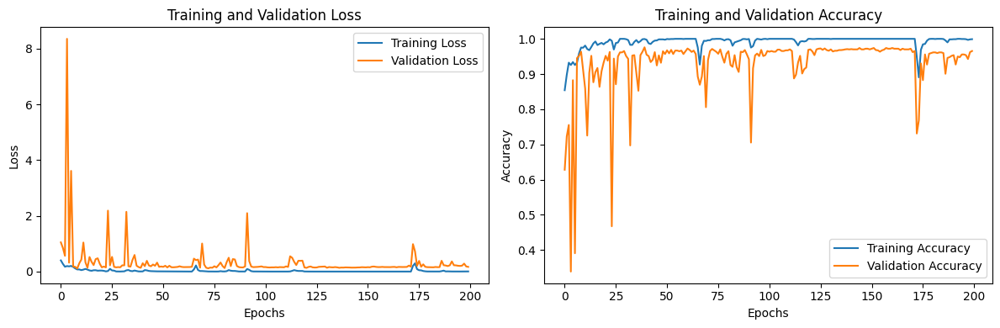

In [ ]:
# Plotting the losses
plt.figure(figsize=(12, 4))

plt.subplot(1, 2, 1)
plt.plot(train_losses, label='Training Loss')
plt.plot(test_losses, label='Validation Loss')
plt.title('Training and Validation Loss')
plt.xlabel('Epochs')
plt.ylabel('Loss')
plt.legend()

# Plotting the accuracies
plt.subplot(1, 2, 2)
plt.plot(train_accuracy, label='Training Accuracy')
plt.plot(val_accuracy, label='Validation Accuracy')
plt.title('Training and Validation Accuracy')
plt.xlabel('Epochs')
plt.ylabel('Accuracy')
plt.legend()

plt.tight_layout()
plt.show()

#visualization - train

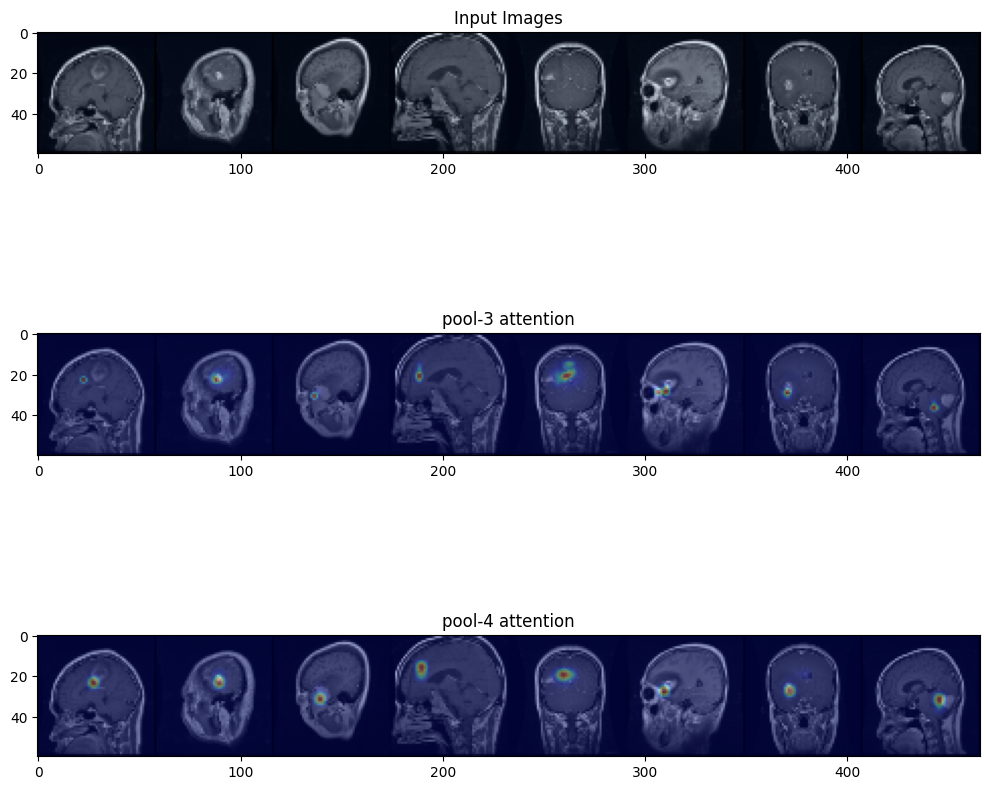

In [ ]:
import matplotlib.pyplot as plt

def unnormalize(img):
    mean = np.array([0.485, 0.456, 0.406])
    std = np.array([0.229, 0.224, 0.225])
    unnorm_img = img.cpu().numpy().transpose((1, 2, 0))
    unnorm_img = std * unnorm_img + mean
    unnorm_img = np.clip(unnorm_img, 0, 1)
    return unnorm_img

def combine_visualizations(I_train, a1, a2, up_factors=(2, 2, 4)):
    def visualize_attention(I_train, a, up_factor, no_attention=False):
      img = unnormalize(I_train)

# def combine_visualizations(I_train, a1, a2, up_factors=(2, 2, 4)):
#     def visualize_attention(I_train, a, up_factor, no_attention=False):
      img = I_train.permute((1,2,0)).cpu().numpy()
    # compute the heatmap
      if up_factor > 1:
        a = F.interpolate(a, scale_factor=up_factor, mode='bilinear', align_corners=False)
        attn = utils.make_grid(a, nrow=8, normalize=True, scale_each=True)
        attn = attn.permute((1,2,0)).mul(255).byte().cpu().numpy()
        attn = cv2.applyColorMap(attn, cv2.COLORMAP_JET)
        attn = cv2.cvtColor(attn, cv2.COLOR_BGR2RGB)
        attn = np.float32(attn) / 255
    # add the heatmap to the image
        img=cv2.resize(img,(466,60))
        if no_attention:
            return torch.from_numpy(img)
        else:
            vis = 0.7 * img + .3 * attn
            return torch.from_numpy(vis)
        # Your existing code for visualize_attention

    orig = visualize_attention(I_train, a1, up_factor=up_factors[0], no_attention=True)
    first = visualize_attention(I_train, a1, up_factor=up_factors[1], no_attention=False)
    second = visualize_attention(I_train, a2, up_factor=up_factors[2], no_attention=False)

    fig, (ax1, ax2, ax3) = plt.subplots(3, 1, figsize=(10, 10))
    ax1.imshow(orig)
    ax2.imshow(first)
    ax3.imshow(second)
    ax1.set_title('Input Images')
    ax2.set_title('pool-3 attention')
    ax3.set_title('pool-4 attention')

    plt.tight_layout()
    plt.show()


# Assuming X_train_batch is your input data
device = torch.device("cuda" if torch.cuda.is_available() else "cpu")

# Move the input data to the same device as the model

for batch_idx, (X_train_batch, _) in enumerate(training_loader):
    X_train_batch = X_train_batch.to(device)
    if batch_idx == 64:
        # Ensure the input batch is on the same device as the model
        X_train_batch = X_train_batch.to(device)

        I_train = utils.make_grid(X_train_batch[0:8, :, :, :], nrow=8, normalize=True, scale_each=True)
        _, a1, a2 = model(X_train_batch[0:8, :, :, :])
        break  # Stop the loop after getting the required batch

combine_visualizations(I_train, a1, a2, up_factors=(2, 2, 4))

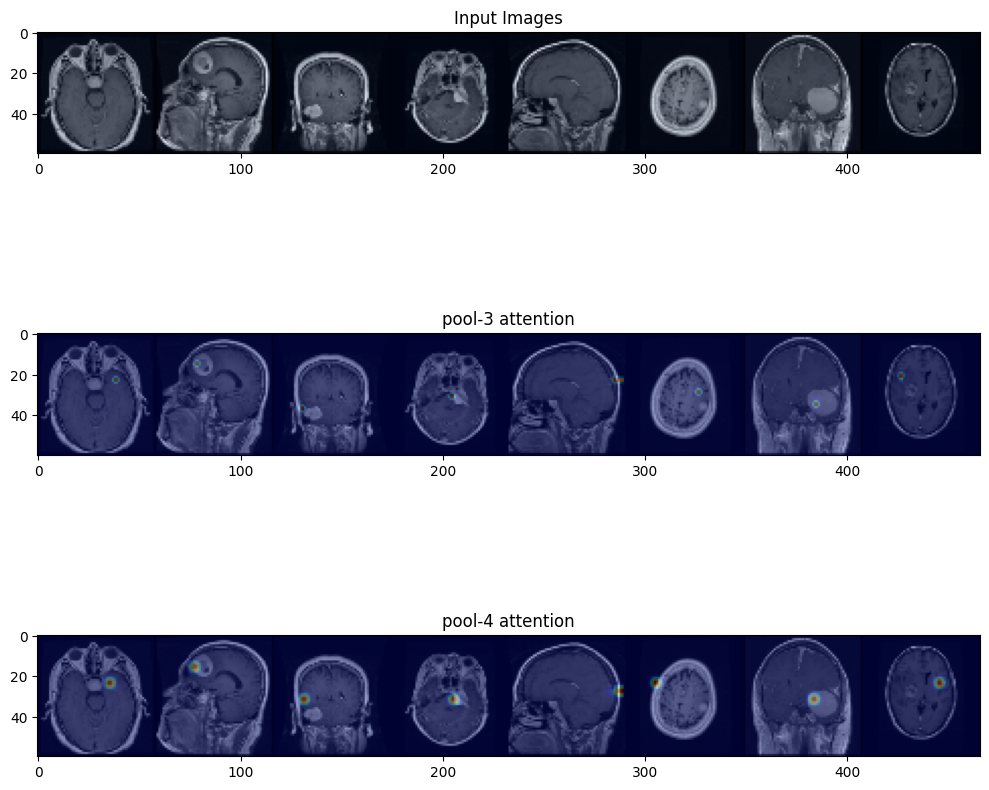

In [ ]:
import matplotlib.pyplot as plt

def unnormalize(img):
    mean = np.array([0.485, 0.456, 0.406])
    std = np.array([0.229, 0.224, 0.225])
    unnorm_img = img.cpu().numpy().transpose((1, 2, 0))
    unnorm_img = std * unnorm_img + mean
    unnorm_img = np.clip(unnorm_img, 0, 1)
    return unnorm_img

def combine_visualizations(I_train, a1, a2, up_factors=(2, 2, 4)):
    def visualize_attention(I_train, a, up_factor, no_attention=False):
      img = unnormalize(I_train)

# def combine_visualizations(I_train, a1, a2, up_factors=(2, 2, 4)):
#     def visualize_attention(I_train, a, up_factor, no_attention=False):
      img = I_train.permute((1,2,0)).cpu().numpy()
    # compute the heatmap
      if up_factor > 1:
        a = F.interpolate(a, scale_factor=up_factor, mode='bilinear', align_corners=False)
        attn = utils.make_grid(a, nrow=8, normalize=True, scale_each=True)
        attn = attn.permute((1,2,0)).mul(255).byte().cpu().numpy()
        attn = cv2.applyColorMap(attn, cv2.COLORMAP_JET)
        attn = cv2.cvtColor(attn, cv2.COLOR_BGR2RGB)
        attn = np.float32(attn) / 255
    # add the heatmap to the image
        img=cv2.resize(img,(466,60))
        if no_attention:
            return torch.from_numpy(img)
        else:
            vis = 0.7 * img + .3 * attn
            return torch.from_numpy(vis)
        # Your existing code for visualize_attention

    orig = visualize_attention(I_train, a1, up_factor=up_factors[0], no_attention=True)
    first = visualize_attention(I_train, a1, up_factor=up_factors[1], no_attention=False)
    second = visualize_attention(I_train, a2, up_factor=up_factors[2], no_attention=False)

    fig, (ax1, ax2, ax3) = plt.subplots(3, 1, figsize=(10, 10))
    ax1.imshow(orig)
    ax2.imshow(first)
    ax3.imshow(second)
    ax1.set_title('Input Images')
    ax2.set_title('pool-3 attention')
    ax3.set_title('pool-4 attention')

    plt.tight_layout()
    plt.show()


# Assuming X_train_batch is your input data
device = torch.device("cuda" if torch.cuda.is_available() else "cpu")

# Move the input data to the same device as the model

for batch_idx, (X_train_batch, _) in enumerate(training_loader):
    X_train_batch = X_train_batch.to(device)
    if batch_idx == 15:
        # Ensure the input batch is on the same device as the model
        X_train_batch = X_train_batch.to(device)

        I_train = utils.make_grid(X_train_batch[0:8, :, :, :], nrow=8, normalize=True, scale_each=True)
        _, a1, a2 = model(X_train_batch[0:8, :, :, :])
        break  # Stop the loop after getting the required batch

combine_visualizations(I_train, a1, a2, up_factors=(2, 2, 4))

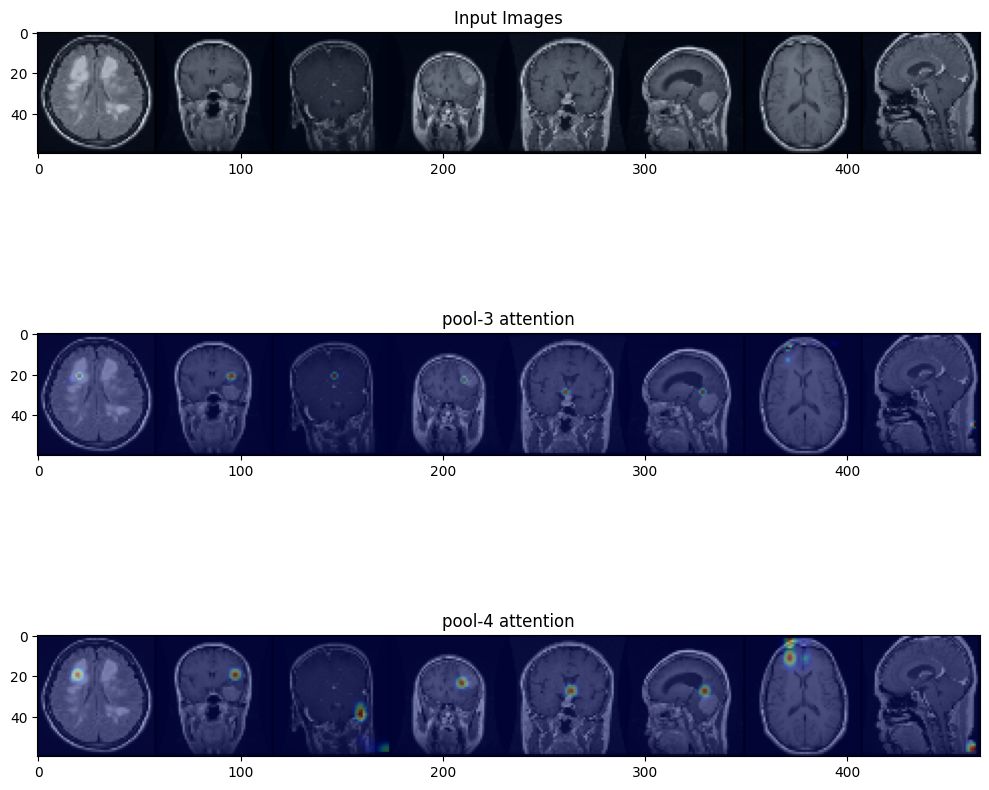

In [ ]:
import matplotlib.pyplot as plt

def unnormalize(img):
    mean = np.array([0.485, 0.456, 0.406])
    std = np.array([0.229, 0.224, 0.225])
    unnorm_img = img.cpu().numpy().transpose((1, 2, 0))
    unnorm_img = std * unnorm_img + mean
    unnorm_img = np.clip(unnorm_img, 0, 1)
    return unnorm_img

def combine_visualizations(I_train, a1, a2, up_factors=(2, 2, 4)):
    def visualize_attention(I_train, a, up_factor, no_attention=False):
      img = unnormalize(I_train)

# def combine_visualizations(I_train, a1, a2, up_factors=(2, 2, 4)):
#     def visualize_attention(I_train, a, up_factor, no_attention=False):
      img = I_train.permute((1,2,0)).cpu().numpy()
    # compute the heatmap
      if up_factor > 1:
        a = F.interpolate(a, scale_factor=up_factor, mode='bilinear', align_corners=False)
        attn = utils.make_grid(a, nrow=8, normalize=True, scale_each=True)
        attn = attn.permute((1,2,0)).mul(255).byte().cpu().numpy()
        attn = cv2.applyColorMap(attn, cv2.COLORMAP_JET)
        attn = cv2.cvtColor(attn, cv2.COLOR_BGR2RGB)
        attn = np.float32(attn) / 255
    # add the heatmap to the image
        img=cv2.resize(img,(466,60))
        if no_attention:
            return torch.from_numpy(img)
        else:
            vis = 0.7 * img + .3 * attn
            return torch.from_numpy(vis)
        # Your existing code for visualize_attention

    orig = visualize_attention(I_train, a1, up_factor=up_factors[0], no_attention=True)
    first = visualize_attention(I_train, a1, up_factor=up_factors[1], no_attention=False)
    second = visualize_attention(I_train, a2, up_factor=up_factors[2], no_attention=False)

    fig, (ax1, ax2, ax3) = plt.subplots(3, 1, figsize=(10, 10))
    ax1.imshow(orig)
    ax2.imshow(first)
    ax3.imshow(second)
    ax1.set_title('Input Images')
    ax2.set_title('pool-3 attention')
    ax3.set_title('pool-4 attention')

    plt.tight_layout()
    plt.show()


# Assuming X_train_batch is your input data
device = torch.device("cuda" if torch.cuda.is_available() else "cpu")

# Move the input data to the same device as the model

for batch_idx, (X_train_batch, _) in enumerate(training_loader):
    X_train_batch = X_train_batch.to(device)
    if batch_idx == 50:
        # Ensure the input batch is on the same device as the model
        X_train_batch = X_train_batch.to(device)

        I_train = utils.make_grid(X_train_batch[0:8, :, :, :], nrow=8, normalize=True, scale_each=True)
        _, a1, a2 = model(X_train_batch[0:8, :, :, :])
        break  # Stop the loop after getting the required batch

combine_visualizations(I_train, a1, a2, up_factors=(2, 2, 4))

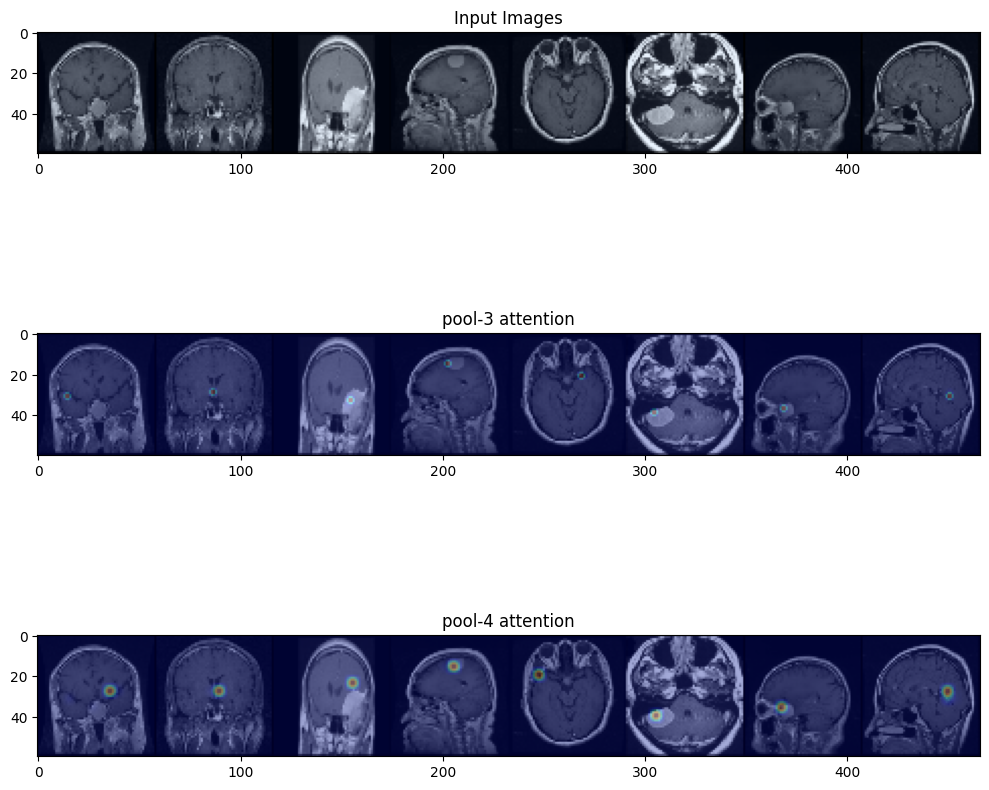

In [ ]:
import matplotlib.pyplot as plt

def unnormalize(img):
    mean = np.array([0.485, 0.456, 0.406])
    std = np.array([0.229, 0.224, 0.225])
    unnorm_img = img.cpu().numpy().transpose((1, 2, 0))
    unnorm_img = std * unnorm_img + mean
    unnorm_img = np.clip(unnorm_img, 0, 1)
    return unnorm_img

def combine_visualizations(I_train, a1, a2, up_factors=(2, 2, 4)):
    def visualize_attention(I_train, a, up_factor, no_attention=False):
      img = unnormalize(I_train)

# def combine_visualizations(I_train, a1, a2, up_factors=(2, 2, 4)):
#     def visualize_attention(I_train, a, up_factor, no_attention=False):
      img = I_train.permute((1,2,0)).cpu().numpy()
    # compute the heatmap
      if up_factor > 1:
        a = F.interpolate(a, scale_factor=up_factor, mode='bilinear', align_corners=False)
        attn = utils.make_grid(a, nrow=8, normalize=True, scale_each=True)
        attn = attn.permute((1,2,0)).mul(255).byte().cpu().numpy()
        attn = cv2.applyColorMap(attn, cv2.COLORMAP_JET)
        attn = cv2.cvtColor(attn, cv2.COLOR_BGR2RGB)
        attn = np.float32(attn) / 255
    # add the heatmap to the image
        img=cv2.resize(img,(466,60))
        if no_attention:
            return torch.from_numpy(img)
        else:
            vis = 0.7 * img + .3 * attn
            return torch.from_numpy(vis)
        # Your existing code for visualize_attention

    orig = visualize_attention(I_train, a1, up_factor=up_factors[0], no_attention=True)
    first = visualize_attention(I_train, a1, up_factor=up_factors[1], no_attention=False)
    second = visualize_attention(I_train, a2, up_factor=up_factors[2], no_attention=False)

    fig, (ax1, ax2, ax3) = plt.subplots(3, 1, figsize=(10, 10))
    ax1.imshow(orig)
    ax2.imshow(first)
    ax3.imshow(second)
    ax1.set_title('Input Images')
    ax2.set_title('pool-3 attention')
    ax3.set_title('pool-4 attention')

    plt.tight_layout()
    plt.show()


# Assuming X_train_batch is your input data
device = torch.device("cuda" if torch.cuda.is_available() else "cpu")

# Move the input data to the same device as the model

for batch_idx, (X_train_batch, _) in enumerate(training_loader):
    X_train_batch = X_train_batch.to(device)
    if batch_idx == 19:
        # Ensure the input batch is on the same device as the model
        X_train_batch = X_train_batch.to(device)

        I_train = utils.make_grid(X_train_batch[0:8, :, :, :], nrow=8, normalize=True, scale_each=True)
        _, a1, a2 = model(X_train_batch[0:8, :, :, :])
        break  # Stop the loop after getting the required batch

combine_visualizations(I_train, a1, a2, up_factors=(2, 2, 4))

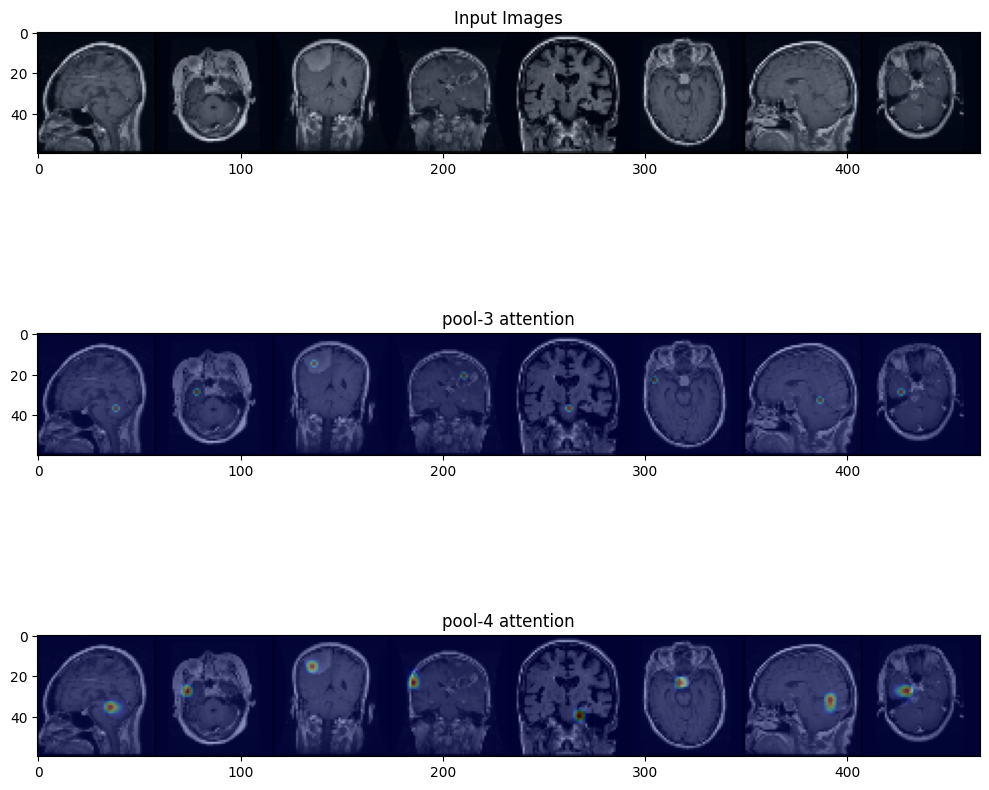

In [ ]:
import matplotlib.pyplot as plt

def unnormalize(img):
    mean = np.array([0.485, 0.456, 0.406])
    std = np.array([0.229, 0.224, 0.225])
    unnorm_img = img.cpu().numpy().transpose((1, 2, 0))
    unnorm_img = std * unnorm_img + mean
    unnorm_img = np.clip(unnorm_img, 0, 1)
    return unnorm_img

def combine_visualizations(I_train, a1, a2, up_factors=(2, 2, 4)):
    def visualize_attention(I_train, a, up_factor, no_attention=False):
      img = unnormalize(I_train)

# def combine_visualizations(I_train, a1, a2, up_factors=(2, 2, 4)):
#     def visualize_attention(I_train, a, up_factor, no_attention=False):
      img = I_train.permute((1,2,0)).cpu().numpy()
    # compute the heatmap
      if up_factor > 1:
        a = F.interpolate(a, scale_factor=up_factor, mode='bilinear', align_corners=False)
        attn = utils.make_grid(a, nrow=8, normalize=True, scale_each=True)
        attn = attn.permute((1,2,0)).mul(255).byte().cpu().numpy()
        attn = cv2.applyColorMap(attn, cv2.COLORMAP_JET)
        attn = cv2.cvtColor(attn, cv2.COLOR_BGR2RGB)
        attn = np.float32(attn) / 255
    # add the heatmap to the image
        img=cv2.resize(img,(466,60))
        if no_attention:
            return torch.from_numpy(img)
        else:
            vis = 0.7 * img + .3 * attn
            return torch.from_numpy(vis)
        # Your existing code for visualize_attention

    orig = visualize_attention(I_train, a1, up_factor=up_factors[0], no_attention=True)
    first = visualize_attention(I_train, a1, up_factor=up_factors[1], no_attention=False)
    second = visualize_attention(I_train, a2, up_factor=up_factors[2], no_attention=False)

    fig, (ax1, ax2, ax3) = plt.subplots(3, 1, figsize=(10, 10))
    ax1.imshow(orig)
    ax2.imshow(first)
    ax3.imshow(second)
    ax1.set_title('Input Images')
    ax2.set_title('pool-3 attention')
    ax3.set_title('pool-4 attention')

    plt.tight_layout()
    plt.show()


# Assuming X_train_batch is your input data
device = torch.device("cuda" if torch.cuda.is_available() else "cpu")

# Move the input data to the same device as the model

for batch_idx, (X_train_batch, _) in enumerate(training_loader):
    X_train_batch = X_train_batch.to(device)
    if batch_idx == 19:
        # Ensure the input batch is on the same device as the model
        X_train_batch = X_train_batch.to(device)

        I_train = utils.make_grid(X_train_batch[0:8, :, :, :], nrow=8, normalize=True, scale_each=True)
        _, a1, a2 = model(X_train_batch[0:8, :, :, :])
        break  # Stop the loop after getting the required batch

combine_visualizations(I_train, a1, a2, up_factors=(2, 2, 4))

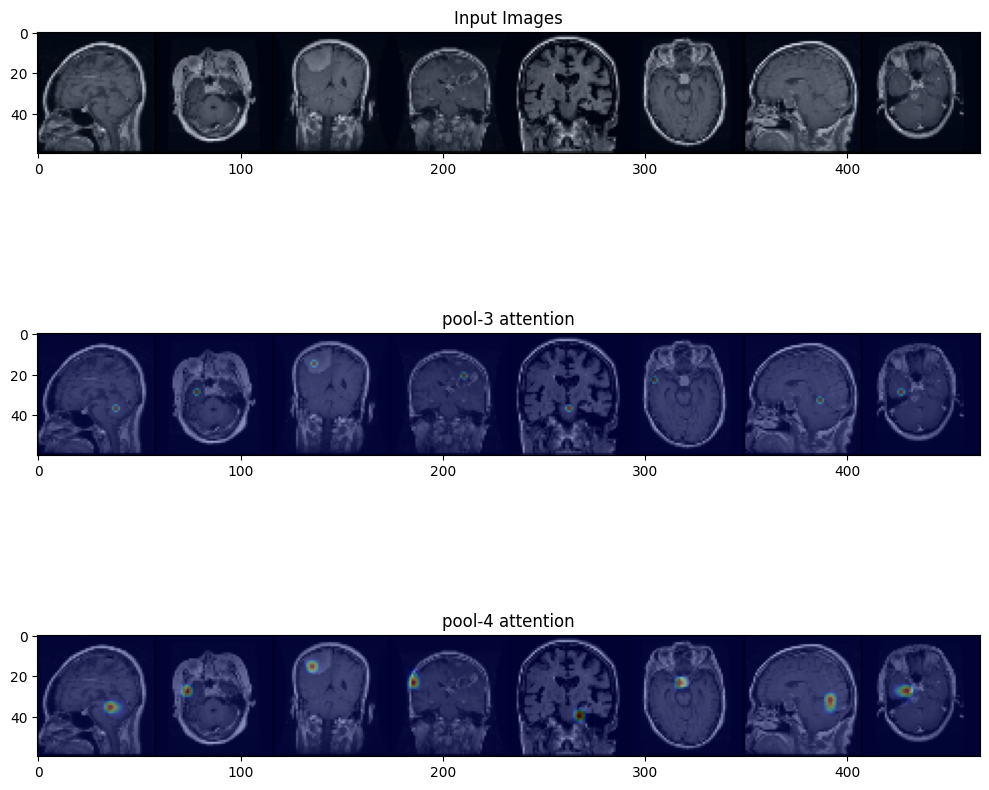

In [ ]:
import matplotlib.pyplot as plt

def unnormalize(img):
    mean = np.array([0.485, 0.456, 0.406])
    std = np.array([0.229, 0.224, 0.225])
    unnorm_img = img.cpu().numpy().transpose((1, 2, 0))
    unnorm_img = std * unnorm_img + mean
    unnorm_img = np.clip(unnorm_img, 0, 1)
    return unnorm_img

def combine_visualizations(I_train, a1, a2, up_factors=(2, 2, 4)):
    def visualize_attention(I_train, a, up_factor, no_attention=False):
      img = unnormalize(I_train)

# def combine_visualizations(I_train, a1, a2, up_factors=(2, 2, 4)):
#     def visualize_attention(I_train, a, up_factor, no_attention=False):
      img = I_train.permute((1,2,0)).cpu().numpy()
    # compute the heatmap
      if up_factor > 1:
        a = F.interpolate(a, scale_factor=up_factor, mode='bilinear', align_corners=False)
        attn = utils.make_grid(a, nrow=8, normalize=True, scale_each=True)
        attn = attn.permute((1,2,0)).mul(255).byte().cpu().numpy()
        attn = cv2.applyColorMap(attn, cv2.COLORMAP_JET)
        attn = cv2.cvtColor(attn, cv2.COLOR_BGR2RGB)
        attn = np.float32(attn) / 255
    # add the heatmap to the image
        img=cv2.resize(img,(466,60))
        if no_attention:
            return torch.from_numpy(img)
        else:
            vis = 0.7 * img + .3 * attn
            return torch.from_numpy(vis)
        # Your existing code for visualize_attention

    orig = visualize_attention(I_train, a1, up_factor=up_factors[0], no_attention=True)
    first = visualize_attention(I_train, a1, up_factor=up_factors[1], no_attention=False)
    second = visualize_attention(I_train, a2, up_factor=up_factors[2], no_attention=False)

    fig, (ax1, ax2, ax3) = plt.subplots(3, 1, figsize=(10, 10))
    ax1.imshow(orig)
    ax2.imshow(first)
    ax3.imshow(second)
    ax1.set_title('Input Images')
    ax2.set_title('pool-3 attention')
    ax3.set_title('pool-4 attention')

    plt.tight_layout()
    plt.show()


# Assuming X_train_batch is your input data
device = torch.device("cuda" if torch.cuda.is_available() else "cpu")

# Move the input data to the same device as the model

for batch_idx, (X_train_batch, _) in enumerate(test_loader):
    X_train_batch = X_train_batch.to(device)
    if batch_idx == 52:
        # Ensure the input batch is on the same device as the model
        X_train_batch = X_train_batch.to(device)

        I_train = utils.make_grid(X_train_batch[0:8, :, :, :], nrow=8, normalize=True, scale_each=True)
        _, a1, a2 = model(X_train_batch[0:8, :, :, :])
        break  # Stop the loop after getting the required batch

combine_visualizations(I_train, a1, a2, up_factors=(2, 2, 4))

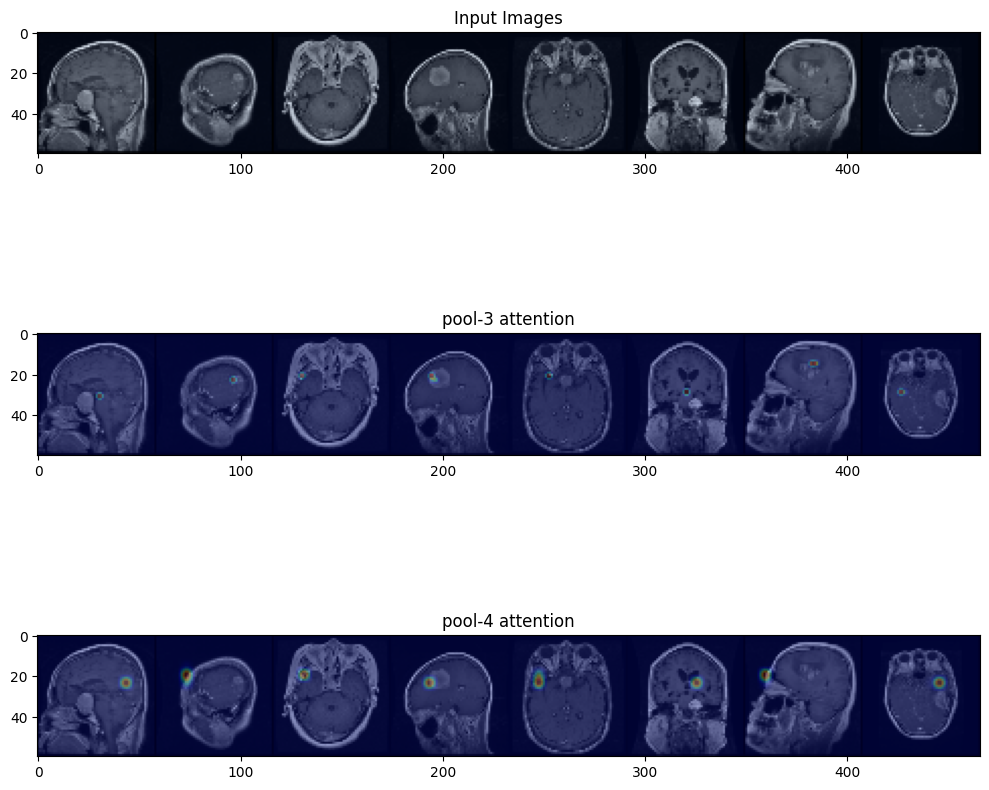

In [ ]:
import matplotlib.pyplot as plt

def unnormalize(img):
    mean = np.array([0.485, 0.456, 0.406])
    std = np.array([0.229, 0.224, 0.225])
    unnorm_img = img.cpu().numpy().transpose((1, 2, 0))
    unnorm_img = std * unnorm_img + mean
    unnorm_img = np.clip(unnorm_img, 0, 1)
    return unnorm_img

def combine_visualizations(I_train, a1, a2, up_factors=(2, 2, 4)):
    def visualize_attention(I_train, a, up_factor, no_attention=False):
      img = unnormalize(I_train)

# def combine_visualizations(I_train, a1, a2, up_factors=(2, 2, 4)):
#     def visualize_attention(I_train, a, up_factor, no_attention=False):
      img = I_train.permute((1,2,0)).cpu().numpy()
    # compute the heatmap
      if up_factor > 1:
        a = F.interpolate(a, scale_factor=up_factor, mode='bilinear', align_corners=False)
        attn = utils.make_grid(a, nrow=8, normalize=True, scale_each=True)
        attn = attn.permute((1,2,0)).mul(255).byte().cpu().numpy()
        attn = cv2.applyColorMap(attn, cv2.COLORMAP_JET)
        attn = cv2.cvtColor(attn, cv2.COLOR_BGR2RGB)
        attn = np.float32(attn) / 255
    # add the heatmap to the image
        img=cv2.resize(img,(466,60))
        if no_attention:
            return torch.from_numpy(img)
        else:
            vis = 0.7 * img + .3 * attn
            return torch.from_numpy(vis)
        # Your existing code for visualize_attention

    orig = visualize_attention(I_train, a1, up_factor=up_factors[0], no_attention=True)
    first = visualize_attention(I_train, a1, up_factor=up_factors[1], no_attention=False)
    second = visualize_attention(I_train, a2, up_factor=up_factors[2], no_attention=False)

    fig, (ax1, ax2, ax3) = plt.subplots(3, 1, figsize=(10, 10))
    ax1.imshow(orig)
    ax2.imshow(first)
    ax3.imshow(second)
    ax1.set_title('Input Images')
    ax2.set_title('pool-3 attention')
    ax3.set_title('pool-4 attention')

    plt.tight_layout()
    plt.show()


# Assuming X_train_batch is your input data
device = torch.device("cuda" if torch.cuda.is_available() else "cpu")

# Move the input data to the same device as the model

for batch_idx, (X_train_batch, _) in enumerate(training_loader):
    X_train_batch = X_train_batch.to(device)
    if batch_idx == 41:
        # Ensure the input batch is on the same device as the model
        X_train_batch = X_train_batch.to(device)

        I_train = utils.make_grid(X_train_batch[0:8, :, :, :], nrow=8, normalize=True, scale_each=True)
        _, a1, a2 = model(X_train_batch[0:8, :, :, :])
        break  # Stop the loop after getting the required batch

combine_visualizations(I_train, a1, a2, up_factors=(2, 2, 4))

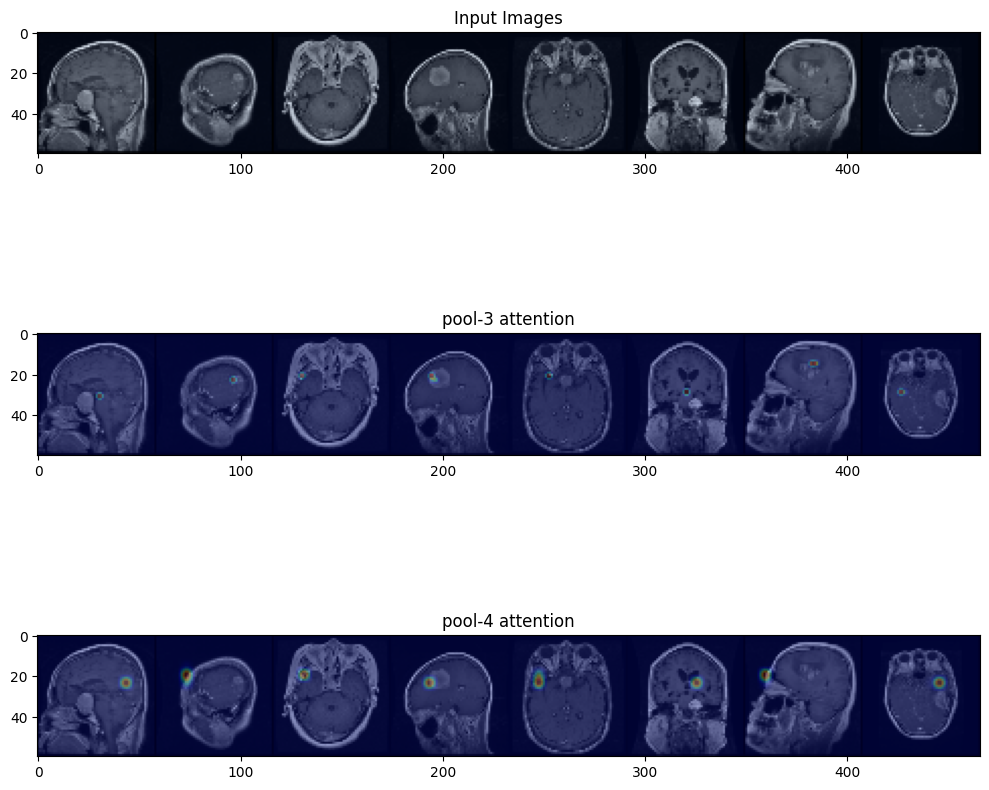

In [ ]:
import matplotlib.pyplot as plt

def unnormalize(img):
    mean = np.array([0.485, 0.456, 0.406])
    std = np.array([0.229, 0.224, 0.225])
    unnorm_img = img.cpu().numpy().transpose((1, 2, 0))
    unnorm_img = std * unnorm_img + mean
    unnorm_img = np.clip(unnorm_img, 0, 1)
    return unnorm_img

def combine_visualizations(I_train, a1, a2, up_factors=(2, 2, 4)):
    def visualize_attention(I_train, a, up_factor, no_attention=False):
      img = unnormalize(I_train)

# def combine_visualizations(I_train, a1, a2, up_factors=(2, 2, 4)):
#     def visualize_attention(I_train, a, up_factor, no_attention=False):
      img = I_train.permute((1,2,0)).cpu().numpy()
    # compute the heatmap
      if up_factor > 1:
        a = F.interpolate(a, scale_factor=up_factor, mode='bilinear', align_corners=False)
        attn = utils.make_grid(a, nrow=8, normalize=True, scale_each=True)
        attn = attn.permute((1,2,0)).mul(255).byte().cpu().numpy()
        attn = cv2.applyColorMap(attn, cv2.COLORMAP_JET)
        attn = cv2.cvtColor(attn, cv2.COLOR_BGR2RGB)
        attn = np.float32(attn) / 255
    # add the heatmap to the image
        img=cv2.resize(img,(466,60))
        if no_attention:
            return torch.from_numpy(img)
        else:
            vis = 0.7 * img + .3 * attn
            return torch.from_numpy(vis)
        # Your existing code for visualize_attention

    orig = visualize_attention(I_train, a1, up_factor=up_factors[0], no_attention=True)
    first = visualize_attention(I_train, a1, up_factor=up_factors[1], no_attention=False)
    second = visualize_attention(I_train, a2, up_factor=up_factors[2], no_attention=False)

    fig, (ax1, ax2, ax3) = plt.subplots(3, 1, figsize=(10, 10))
    ax1.imshow(orig)
    ax2.imshow(first)
    ax3.imshow(second)
    ax1.set_title('Input Images')
    ax2.set_title('pool-3 attention')
    ax3.set_title('pool-4 attention')

    plt.tight_layout()
    plt.show()


# Assuming X_train_batch is your input data
device = torch.device("cuda" if torch.cuda.is_available() else "cpu")

# Move the input data to the same device as the model

for batch_idx, (X_train_batch, _) in enumerate(test_loader):
    X_train_batch = X_train_batch.to(device)
    if batch_idx == 27:
        # Ensure the input batch is on the same device as the model
        X_train_batch = X_train_batch.to(device)

        I_train = utils.make_grid(X_train_batch[0:8, :, :, :], nrow=8, normalize=True, scale_each=True)
        _, a1, a2 = model(X_train_batch[0:8, :, :, :])
        break  # Stop the loop after getting the required batch

combine_visualizations(I_train, a1, a2, up_factors=(2, 2, 4))

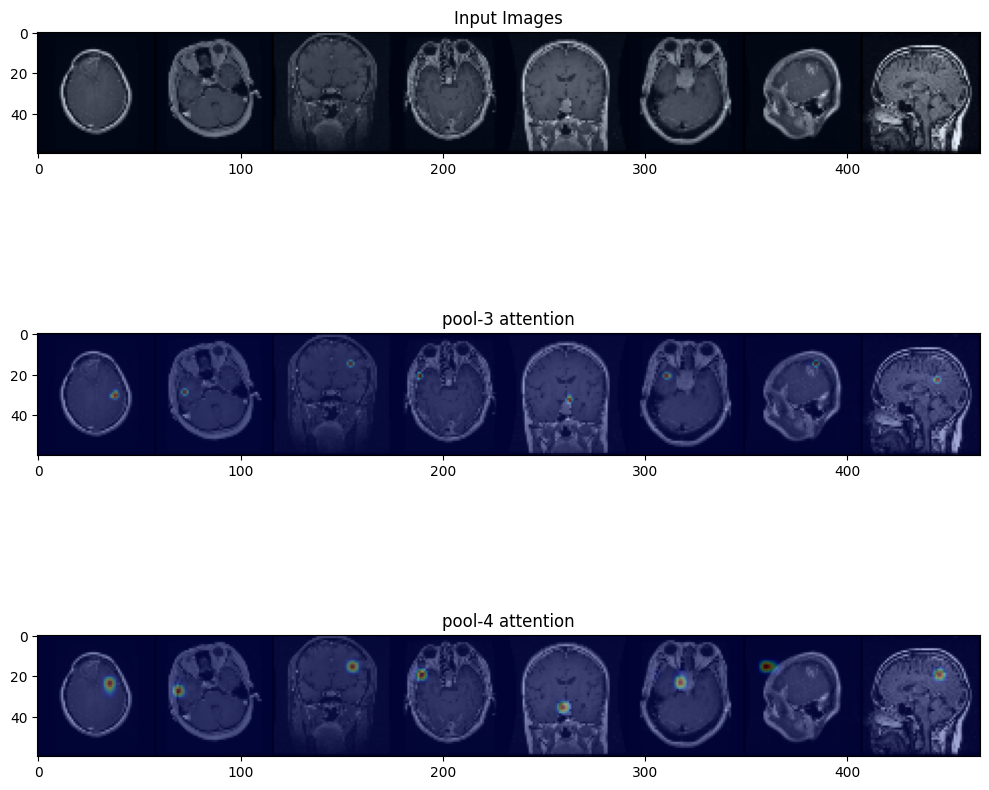

In [ ]:
import matplotlib.pyplot as plt

def unnormalize(img):
    mean = np.array([0.485, 0.456, 0.406])
    std = np.array([0.229, 0.224, 0.225])
    unnorm_img = img.cpu().numpy().transpose((1, 2, 0))
    unnorm_img = std * unnorm_img + mean
    unnorm_img = np.clip(unnorm_img, 0, 1)
    return unnorm_img

def combine_visualizations(I_train, a1, a2, up_factors=(2, 2, 4)):
    def visualize_attention(I_train, a, up_factor, no_attention=False):
      img = unnormalize(I_train)

# def combine_visualizations(I_train, a1, a2, up_factors=(2, 2, 4)):
#     def visualize_attention(I_train, a, up_factor, no_attention=False):
      img = I_train.permute((1,2,0)).cpu().numpy()
    # compute the heatmap
      if up_factor > 1:
        a = F.interpolate(a, scale_factor=up_factor, mode='bilinear', align_corners=False)
        attn = utils.make_grid(a, nrow=8, normalize=True, scale_each=True)
        attn = attn.permute((1,2,0)).mul(255).byte().cpu().numpy()
        attn = cv2.applyColorMap(attn, cv2.COLORMAP_JET)
        attn = cv2.cvtColor(attn, cv2.COLOR_BGR2RGB)
        attn = np.float32(attn) / 255
    # add the heatmap to the image
        img=cv2.resize(img,(466,60))
        if no_attention:
            return torch.from_numpy(img)
        else:
            vis = 0.7 * img + .3 * attn
            return torch.from_numpy(vis)
        # Your existing code for visualize_attention

    orig = visualize_attention(I_train, a1, up_factor=up_factors[0], no_attention=True)
    first = visualize_attention(I_train, a1, up_factor=up_factors[1], no_attention=False)
    second = visualize_attention(I_train, a2, up_factor=up_factors[2], no_attention=False)

    fig, (ax1, ax2, ax3) = plt.subplots(3, 1, figsize=(10, 10))
    ax1.imshow(orig)
    ax2.imshow(first)
    ax3.imshow(second)
    ax1.set_title('Input Images')
    ax2.set_title('pool-3 attention')
    ax3.set_title('pool-4 attention')

    plt.tight_layout()
    plt.show()


# Assuming X_train_batch is your input data
device = torch.device("cuda" if torch.cuda.is_available() else "cpu")

# Move the input data to the same device as the model

for batch_idx, (X_train_batch, _) in enumerate(validation_loader):
    X_train_batch = X_train_batch.to(device)
    if batch_idx == 51:
        # Ensure the input batch is on the same device as the model
        X_train_batch = X_train_batch.to(device)

        I_train = utils.make_grid(X_train_batch[0:8, :, :, :], nrow=8, normalize=True, scale_each=True)
        _, a1, a2 = model(X_train_batch[0:8, :, :, :])
        break  # Stop the loop after getting the required batch

combine_visualizations(I_train, a1, a2, up_factors=(2, 2, 4))

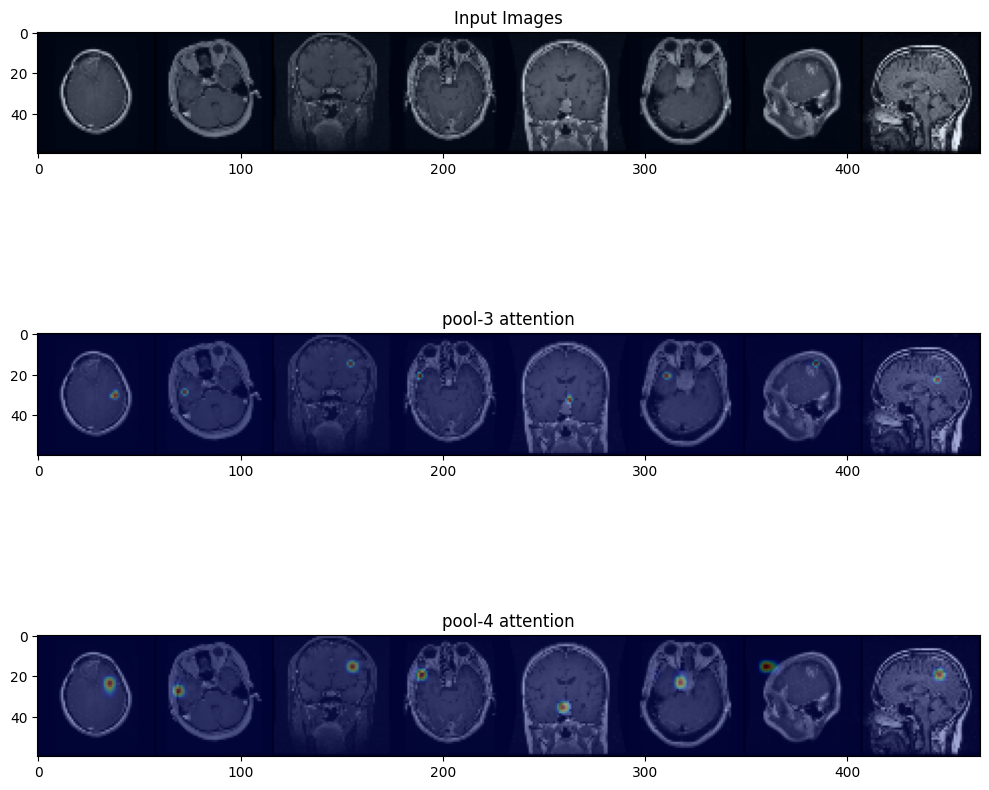

In [ ]:
import matplotlib.pyplot as plt

def unnormalize(img):
    mean = np.array([0.485, 0.456, 0.406])
    std = np.array([0.229, 0.224, 0.225])
    unnorm_img = img.cpu().numpy().transpose((1, 2, 0))
    unnorm_img = std * unnorm_img + mean
    unnorm_img = np.clip(unnorm_img, 0, 1)
    return unnorm_img

def combine_visualizations(I_train, a1, a2, up_factors=(2, 2, 4)):
    def visualize_attention(I_train, a, up_factor, no_attention=False):
      img = unnormalize(I_train)

# def combine_visualizations(I_train, a1, a2, up_factors=(2, 2, 4)):
#     def visualize_attention(I_train, a, up_factor, no_attention=False):
      img = I_train.permute((1,2,0)).cpu().numpy()
    # compute the heatmap
      if up_factor > 1:
        a = F.interpolate(a, scale_factor=up_factor, mode='bilinear', align_corners=False)
        attn = utils.make_grid(a, nrow=8, normalize=True, scale_each=True)
        attn = attn.permute((1,2,0)).mul(255).byte().cpu().numpy()
        attn = cv2.applyColorMap(attn, cv2.COLORMAP_JET)
        attn = cv2.cvtColor(attn, cv2.COLOR_BGR2RGB)
        attn = np.float32(attn) / 255
    # add the heatmap to the image
        img=cv2.resize(img,(466,60))
        if no_attention:
            return torch.from_numpy(img)
        else:
            vis = 0.7 * img + .3 * attn
            return torch.from_numpy(vis)
        # Your existing code for visualize_attention

    orig = visualize_attention(I_train, a1, up_factor=up_factors[0], no_attention=True)
    first = visualize_attention(I_train, a1, up_factor=up_factors[1], no_attention=False)
    second = visualize_attention(I_train, a2, up_factor=up_factors[2], no_attention=False)

    fig, (ax1, ax2, ax3) = plt.subplots(3, 1, figsize=(10, 10))
    ax1.imshow(orig)
    ax2.imshow(first)
    ax3.imshow(second)
    ax1.set_title('Input Images')
    ax2.set_title('pool-3 attention')
    ax3.set_title('pool-4 attention')

    plt.tight_layout()
    plt.show()


# Assuming X_train_batch is your input data
device = torch.device("cuda" if torch.cuda.is_available() else "cpu")

# Move the input data to the same device as the model

for batch_idx, (X_train_batch, _) in enumerate(validation_loader):
    X_train_batch = X_train_batch.to(device)
    if batch_idx == 51:
        # Ensure the input batch is on the same device as the model
        X_train_batch = X_train_batch.to(device)

        I_train = utils.make_grid(X_train_batch[0:8, :, :, :], nrow=8, normalize=True, scale_each=True)
        _, a1, a2 = model(X_train_batch[0:8, :, :, :])
        break  # Stop the loop after getting the required batch

combine_visualizations(I_train, a1, a2, up_factors=(2, 2, 4))

#test

In [ ]:
from sklearn.metrics import precision_score, recall_score, f1_score, accuracy_score, roc_auc_score
from sklearn.metrics import roc_auc_score

test_losses = []
test_accuracy = []
y_true_list = []  # Store true labels for AUC calculation
y_probs_list = []  # Store probabilities for AUC calculation

model.eval()  # Set the model to evaluation mode

with torch.no_grad():
    true_labels = []
    predicted_labels = []

    for X_test, y_test in validation_loader:  # Assuming test_loader is your test data loader
        X_test, y_test = X_test.cuda(), y_test.cuda()

        y_pred, _, _ = model(X_test)
        loss = criterion(torch.sigmoid(y_pred.type(torch.FloatTensor)), y_test.type(torch.LongTensor))
        test_losses.append(loss.item())

        # Calculate test accuracy
        _, predicted_test = torch.max(y_pred, 1)
        correct_test = (predicted_test == y_test).sum().item()
        test_accuracy.append(correct_test / y_test.size(0))  # Calculate accuracy per batch

        # Calculate AUC
        y_probs = torch.sigmoid(y_pred)
        y_probs = y_probs.cpu().detach().numpy()
        y_probs_list.append(y_probs)
        y_true = y_test.cpu().numpy()
        y_true_list.append(y_true)

        # Calculate other metrics
        predicted_labels.extend(predicted_test.cpu().numpy())
        true_labels.extend(y_test.cpu().numpy())

    test_accuracy = np.mean(test_accuracy)
    test_loss = np.mean(test_losses)

    # Concatenate true labels for AUC calculation
    y_true_concatenated = np.concatenate(y_true_list)

    # Concatenate probabilities for AUC calculation
    y_probs_concatenated = np.concatenate(y_probs_list, axis=0)
    # Assuming y_probs_concatenated is the raw output scores from your model
# Apply softmax to obtain probabilities
    y_probs_softmax = np.exp(y_probs_concatenated) / np.sum(np.exp(y_probs_concatenated), axis=1, keepdims=True)

# Calculate AUC for multi-class using 'macro' strategy
    test_auc = roc_auc_score(y_true_concatenated, y_probs_softmax, average='macro', multi_class='ovo')

    # Calculate precision, recall, and F1-score
    precision = precision_score(true_labels, predicted_labels, average=None)
    recall = recall_score(true_labels, predicted_labels, average=None)
    f1 = f1_score(true_labels, predicted_labels, average=None)

    # Print the metrics for each class
    # for i in range(len(precision)):
    #     print(f'Class {i} - Precision: {precision[i]:.8f}, Recall: {recall[i]:.8f}, F1-Score: {f1[i]:.8f}')

    # print(f'Test Loss: {test_loss:.8f}')
    # print(f'Test Accuracy: {test_accuracy:.8f}')
    print(f'Test AUC: {test_auc:.8f}')
    print(f'precision: {precision}')
    print(f'recall: {recall}')
    print(f'f1: {f1}')


Test AUC: 0.99392968
precision: [0.95604396 0.96103896 0.98113208]
recall: [0.98305085 0.93670886 0.975     ]
f1: [0.96935933 0.94871795 0.97805643]


In [ ]:
from sklearn.metrics import precision_score, recall_score, f1_score, accuracy_score, roc_auc_score
from sklearn.metrics import roc_auc_score

test_losses = []
test_accuracy = []
y_true_list = []  # Store true labels for AUC calculation
y_probs_list = []  # Store probabilities for AUC calculation

model.eval()  # Set the model to evaluation mode

with torch.no_grad():
    true_labels = []
    predicted_labels = []

    for X_test, y_test in test_loader:  # Assuming test_loader is your test data loader
        X_test, y_test = X_test.cuda(), y_test.cuda()

        y_pred, _, _ = model(X_test)
        loss = criterion(torch.sigmoid(y_pred.type(torch.FloatTensor)), y_test.type(torch.LongTensor))
        test_losses.append(loss.item())

        # Calculate test accuracy
        _, predicted_test = torch.max(y_pred, 1)
        correct_test = (predicted_test == y_test).sum().item()
        test_accuracy.append(correct_test / y_test.size(0))  # Calculate accuracy per batch

        # Calculate AUC
        y_probs = torch.sigmoid(y_pred)
        y_probs = y_probs.cpu().detach().numpy()
        y_probs_list.append(y_probs)
        y_true = y_test.cpu().numpy()
        y_true_list.append(y_true)

        # Calculate other metrics
        predicted_labels.extend(predicted_test.cpu().numpy())
        true_labels.extend(y_test.cpu().numpy())

    test_accuracy = np.mean(test_accuracy)
    test_loss = np.mean(test_losses)

    # Concatenate true labels for AUC calculation
    y_true_concatenated = np.concatenate(y_true_list)

    # Concatenate probabilities for AUC calculation
    y_probs_concatenated = np.concatenate(y_probs_list, axis=0)
    # Assuming y_probs_concatenated is the raw output scores from your model
# Apply softmax to obtain probabilities
    y_probs_softmax = np.exp(y_probs_concatenated) / np.sum(np.exp(y_probs_concatenated), axis=1, keepdims=True)

# Calculate AUC for multi-class using 'macro' strategy
    test_auc = roc_auc_score(y_true_concatenated, y_probs_softmax, average='macro', multi_class='ovo')

    # Calculate precision, recall, and F1-score
    precision = precision_score(true_labels, predicted_labels, average=None)
    recall = recall_score(true_labels, predicted_labels, average=None)
    f1 = f1_score(true_labels, predicted_labels, average=None)

    # Print the metrics for each class
    # for i in range(len(precision)):
    #     print(f'Class {i} - Precision: {precision[i]:.8f}, Recall: {recall[i]:.8f}, F1-Score: {f1[i]:.8f}')

    # print(f'Test Loss: {test_loss:.8f}')
    # print(f'Test Accuracy: {test_accuracy:.8f}')
    print(f'Test AUC: {test_auc:.8f}')
    print(f'precision: {precision}')
    print(f'recall: {recall}')
    print(f'f1: {f1}')


Test AUC: 0.90184567
precision: [0.94871795 0.64739884 0.84415584]
recall: [0.37       0.97391304 0.87837838]
f1: [0.5323741  0.77777778 0.86092715]


#vis test

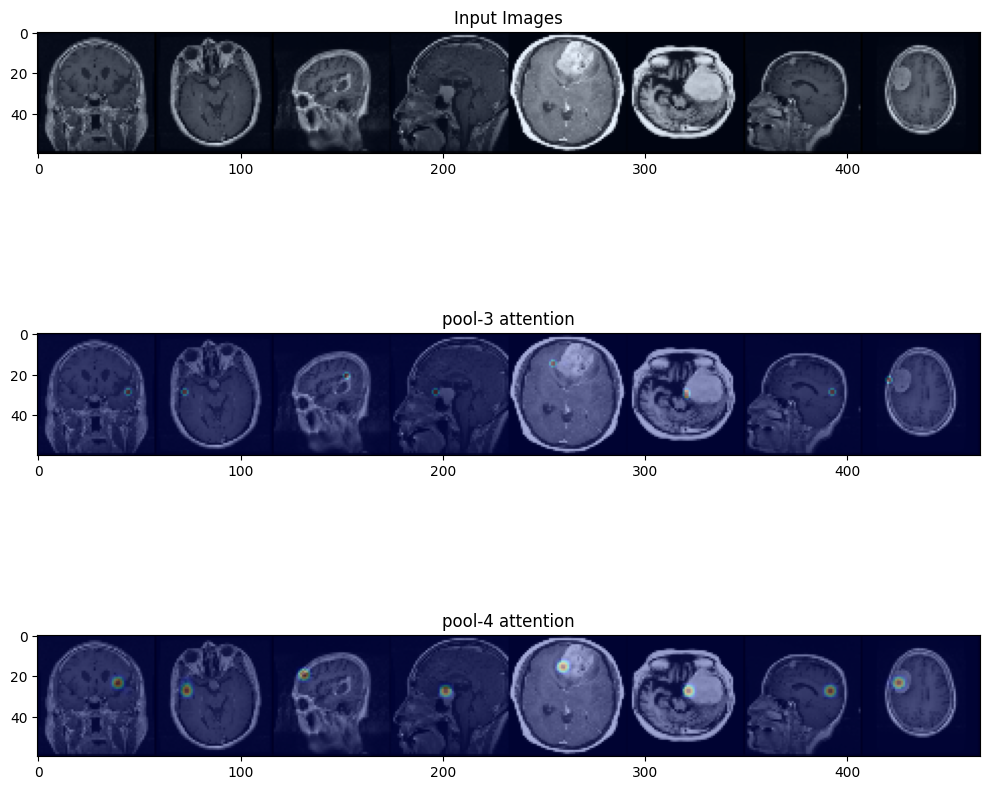

In [ ]:
import matplotlib.pyplot as plt

def unnormalize(img):
    mean = np.array([0.485, 0.456, 0.406])
    std = np.array([0.229, 0.224, 0.225])
    unnorm_img = img.cpu().numpy().transpose((1, 2, 0))
    unnorm_img = std * unnorm_img + mean
    unnorm_img = np.clip(unnorm_img, 0, 1)
    return unnorm_img

def combine_visualizations(I_train, a1, a2, up_factors=(2, 2, 4)):
    def visualize_attention(I_train, a, up_factor, no_attention=False):
      img = unnormalize(I_train)

# def combine_visualizations(I_train, a1, a2, up_factors=(2, 2, 4)):
#     def visualize_attention(I_train, a, up_factor, no_attention=False):
      img = I_train.permute((1,2,0)).cpu().numpy()
    # compute the heatmap
      if up_factor > 1:
        a = F.interpolate(a, scale_factor=up_factor, mode='bilinear', align_corners=False)
        attn = utils.make_grid(a, nrow=8, normalize=True, scale_each=True)
        attn = attn.permute((1,2,0)).mul(255).byte().cpu().numpy()
        attn = cv2.applyColorMap(attn, cv2.COLORMAP_JET)
        attn = cv2.cvtColor(attn, cv2.COLOR_BGR2RGB)
        attn = np.float32(attn) / 255
    # add the heatmap to the image
        img=cv2.resize(img,(466,60))
        if no_attention:
            return torch.from_numpy(img)
        else:
            vis = 0.7 * img + .3 * attn
            return torch.from_numpy(vis)
        # Your existing code for visualize_attention

    orig = visualize_attention(I_train, a1, up_factor=up_factors[0], no_attention=True)
    first = visualize_attention(I_train, a1, up_factor=up_factors[1], no_attention=False)
    second = visualize_attention(I_train, a2, up_factor=up_factors[2], no_attention=False)

    fig, (ax1, ax2, ax3) = plt.subplots(3, 1, figsize=(10, 10))
    ax1.imshow(orig)
    ax2.imshow(first)
    ax3.imshow(second)
    ax1.set_title('Input Images')
    ax2.set_title('pool-3 attention')
    ax3.set_title('pool-4 attention')

    plt.tight_layout()
    plt.show()


# Assuming X_train_batch is your input data
device = torch.device("cuda" if torch.cuda.is_available() else "cpu")

# Move the input data to the same device as the model

for batch_idx, (X_train_batch, _) in enumerate(test_loader):
    X_train_batch = X_train_batch.to(device)
    if batch_idx == 64:
        # Ensure the input batch is on the same device as the model
        X_train_batch = X_train_batch.to(device)

        I_train = utils.make_grid(X_train_batch[0:8, :, :, :], nrow=8, normalize=True, scale_each=True)
        _, a1, a2 = model(X_train_batch[0:8, :, :, :])
        break  # Stop the loop after getting the required batch

combine_visualizations(I_train, a1, a2, up_factors=(2, 2, 4))

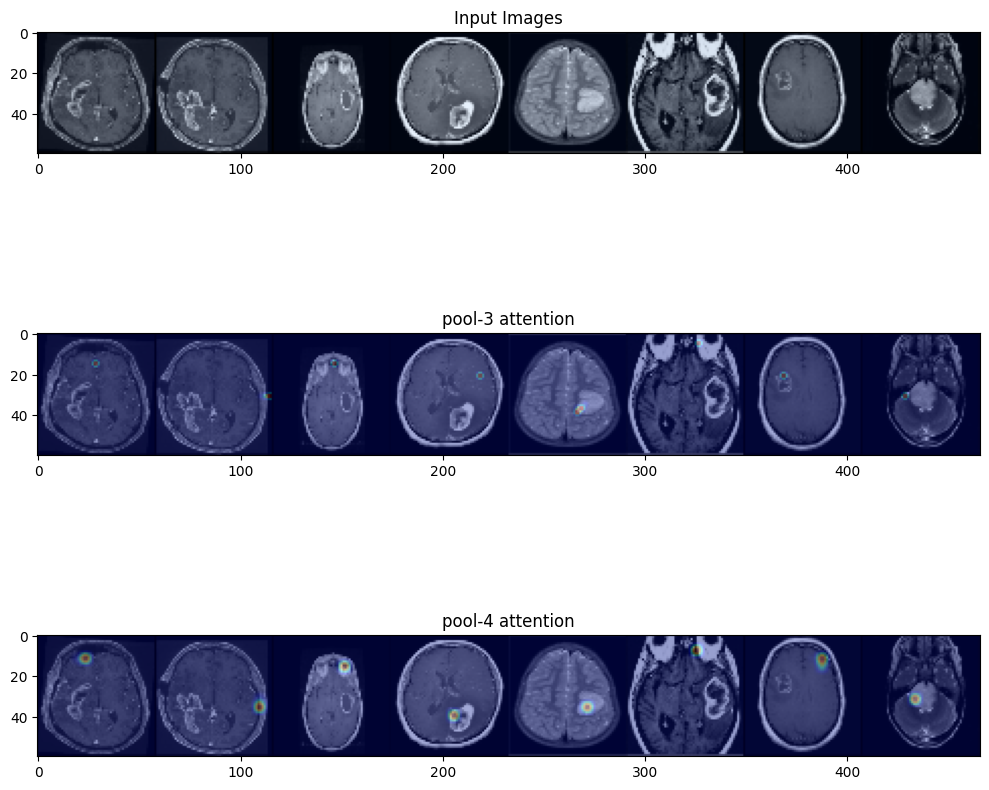

In [ ]:
import matplotlib.pyplot as plt

def unnormalize(img):
    mean = np.array([0.485, 0.456, 0.406])
    std = np.array([0.229, 0.224, 0.225])
    unnorm_img = img.cpu().numpy().transpose((1, 2, 0))
    unnorm_img = std * unnorm_img + mean
    unnorm_img = np.clip(unnorm_img, 0, 1)
    return unnorm_img

def combine_visualizations(I_train, a1, a2, up_factors=(2, 2, 4)):
    def visualize_attention(I_train, a, up_factor, no_attention=False):
      img = unnormalize(I_train)

# def combine_visualizations(I_train, a1, a2, up_factors=(2, 2, 4)):
#     def visualize_attention(I_train, a, up_factor, no_attention=False):
      img = I_train.permute((1,2,0)).cpu().numpy()
    # compute the heatmap
      if up_factor > 1:
        a = F.interpolate(a, scale_factor=up_factor, mode='bilinear', align_corners=False)
        attn = utils.make_grid(a, nrow=8, normalize=True, scale_each=True)
        attn = attn.permute((1,2,0)).mul(255).byte().cpu().numpy()
        attn = cv2.applyColorMap(attn, cv2.COLORMAP_JET)
        attn = cv2.cvtColor(attn, cv2.COLOR_BGR2RGB)
        attn = np.float32(attn) / 255
    # add the heatmap to the image
        img=cv2.resize(img,(466,60))
        if no_attention:
            return torch.from_numpy(img)
        else:
            vis = 0.7 * img + .3 * attn
            return torch.from_numpy(vis)
        # Your existing code for visualize_attention

    orig = visualize_attention(I_train, a1, up_factor=up_factors[0], no_attention=True)
    first = visualize_attention(I_train, a1, up_factor=up_factors[1], no_attention=False)
    second = visualize_attention(I_train, a2, up_factor=up_factors[2], no_attention=False)

    fig, (ax1, ax2, ax3) = plt.subplots(3, 1, figsize=(10, 10))
    ax1.imshow(orig)
    ax2.imshow(first)
    ax3.imshow(second)
    ax1.set_title('Input Images')
    ax2.set_title('pool-3 attention')
    ax3.set_title('pool-4 attention')

    plt.tight_layout()
    plt.show()


# Assuming X_train_batch is your input data
device = torch.device("cuda" if torch.cuda.is_available() else "cpu")

# Move the input data to the same device as the model

for batch_idx, (X_train_batch, _) in enumerate(test_loader):
    X_train_batch = X_train_batch.to(device)
    if batch_idx == 1:
        # Ensure the input batch is on the same device as the model
        X_train_batch = X_train_batch.to(device)

        I_train = utils.make_grid(X_train_batch[0:8, :, :, :], nrow=8, normalize=True, scale_each=True)
        _, a1, a2 = model(X_train_batch[0:8, :, :, :])
        break  # Stop the loop after getting the required batch

combine_visualizations(I_train, a1, a2, up_factors=(2, 2, 4))

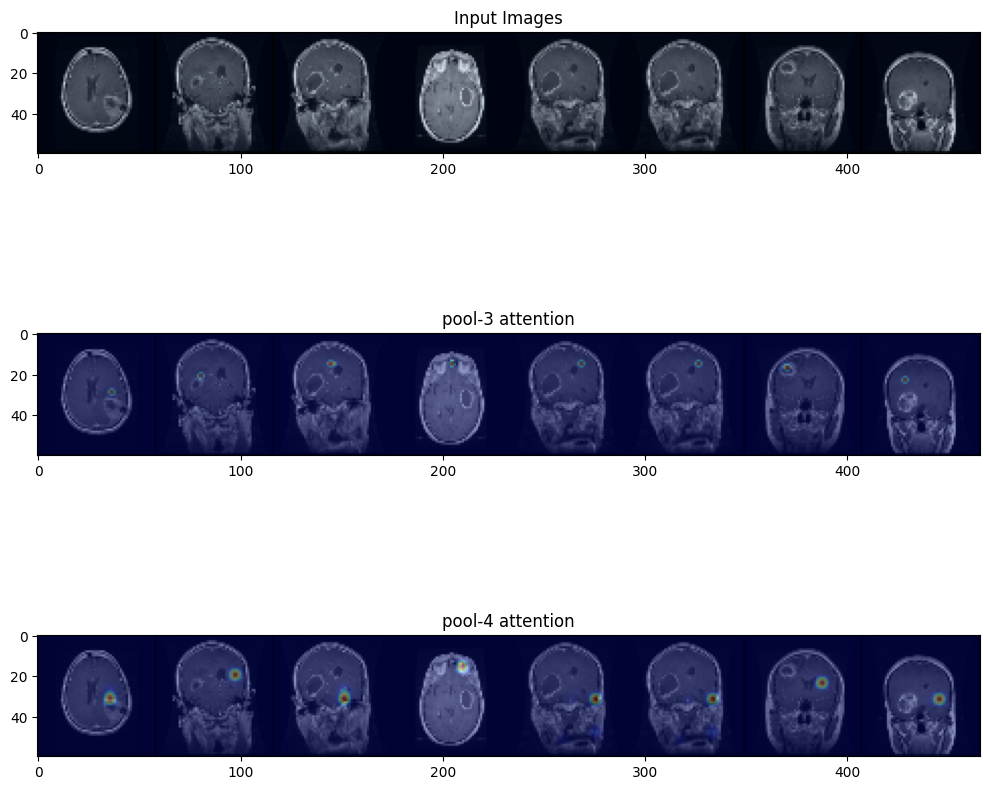

In [ ]:
import matplotlib.pyplot as plt

def unnormalize(img):
    mean = np.array([0.485, 0.456, 0.406])
    std = np.array([0.229, 0.224, 0.225])
    unnorm_img = img.cpu().numpy().transpose((1, 2, 0))
    unnorm_img = std * unnorm_img + mean
    unnorm_img = np.clip(unnorm_img, 0, 1)
    return unnorm_img

def combine_visualizations(I_train, a1, a2, up_factors=(2, 2, 4)):
    def visualize_attention(I_train, a, up_factor, no_attention=False):
      img = unnormalize(I_train)

# def combine_visualizations(I_train, a1, a2, up_factors=(2, 2, 4)):
#     def visualize_attention(I_train, a, up_factor, no_attention=False):
      img = I_train.permute((1,2,0)).cpu().numpy()
    # compute the heatmap
      if up_factor > 1:
        a = F.interpolate(a, scale_factor=up_factor, mode='bilinear', align_corners=False)
        attn = utils.make_grid(a, nrow=8, normalize=True, scale_each=True)
        attn = attn.permute((1,2,0)).mul(255).byte().cpu().numpy()
        attn = cv2.applyColorMap(attn, cv2.COLORMAP_JET)
        attn = cv2.cvtColor(attn, cv2.COLOR_BGR2RGB)
        attn = np.float32(attn) / 255
    # add the heatmap to the image
        img=cv2.resize(img,(466,60))
        if no_attention:
            return torch.from_numpy(img)
        else:
            vis = 0.7 * img + .3 * attn
            return torch.from_numpy(vis)
        # Your existing code for visualize_attention

    orig = visualize_attention(I_train, a1, up_factor=up_factors[0], no_attention=True)
    first = visualize_attention(I_train, a1, up_factor=up_factors[1], no_attention=False)
    second = visualize_attention(I_train, a2, up_factor=up_factors[2], no_attention=False)

    fig, (ax1, ax2, ax3) = plt.subplots(3, 1, figsize=(10, 10))
    ax1.imshow(orig)
    ax2.imshow(first)
    ax3.imshow(second)
    ax1.set_title('Input Images')
    ax2.set_title('pool-3 attention')
    ax3.set_title('pool-4 attention')

    plt.tight_layout()
    plt.show()


# Assuming X_train_batch is your input data
device = torch.device("cuda" if torch.cuda.is_available() else "cpu")

# Move the input data to the same device as the model

for batch_idx, (X_train_batch, _) in enumerate(test_loader):
    X_train_batch = X_train_batch.to(device)
    if batch_idx == 2:
        # Ensure the input batch is on the same device as the model
        X_train_batch = X_train_batch.to(device)

        I_train = utils.make_grid(X_train_batch[0:8, :, :, :], nrow=8, normalize=True, scale_each=True)
        _, a1, a2 = model(X_train_batch[0:8, :, :, :])
        break  # Stop the loop after getting the required batch

combine_visualizations(I_train, a1, a2, up_factors=(2, 2, 4))

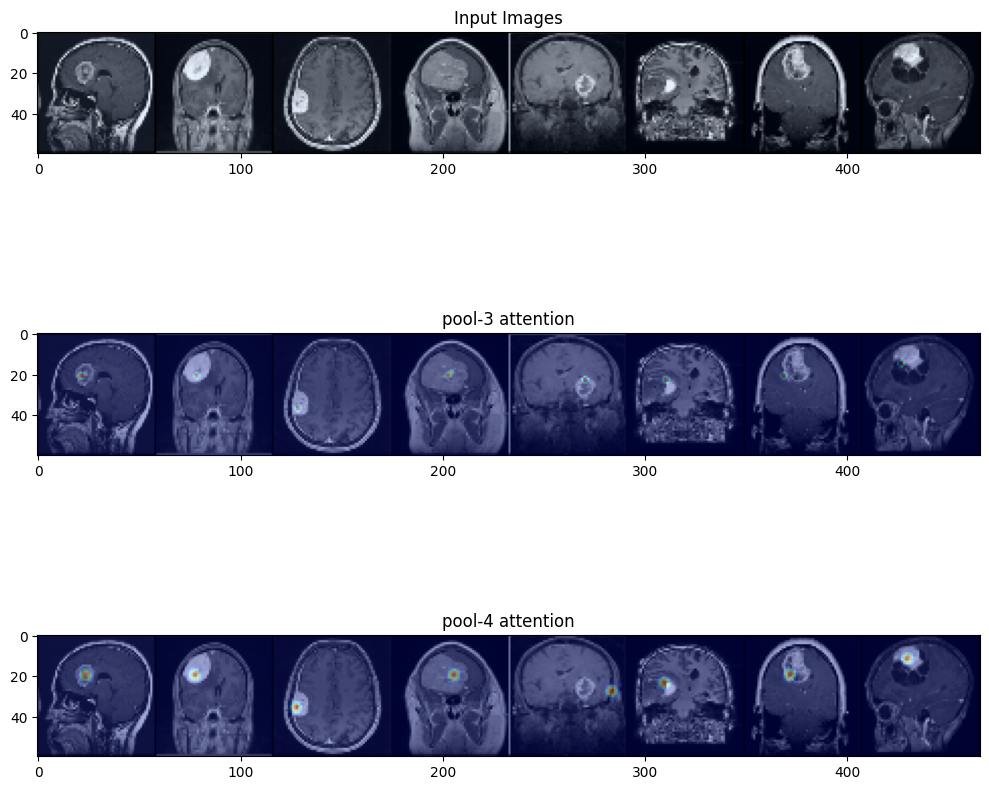

In [ ]:
import matplotlib.pyplot as plt

def unnormalize(img):
    mean = np.array([0.485, 0.456, 0.406])
    std = np.array([0.229, 0.224, 0.225])
    unnorm_img = img.cpu().numpy().transpose((1, 2, 0))
    unnorm_img = std * unnorm_img + mean
    unnorm_img = np.clip(unnorm_img, 0, 1)
    return unnorm_img

def combine_visualizations(I_train, a1, a2, up_factors=(2, 2, 4)):
    def visualize_attention(I_train, a, up_factor, no_attention=False):
      img = unnormalize(I_train)

# def combine_visualizations(I_train, a1, a2, up_factors=(2, 2, 4)):
#     def visualize_attention(I_train, a, up_factor, no_attention=False):
      img = I_train.permute((1,2,0)).cpu().numpy()
    # compute the heatmap
      if up_factor > 1:
        a = F.interpolate(a, scale_factor=up_factor, mode='bilinear', align_corners=False)
        attn = utils.make_grid(a, nrow=8, normalize=True, scale_each=True)
        attn = attn.permute((1,2,0)).mul(255).byte().cpu().numpy()
        attn = cv2.applyColorMap(attn, cv2.COLORMAP_JET)
        attn = cv2.cvtColor(attn, cv2.COLOR_BGR2RGB)
        attn = np.float32(attn) / 255
    # add the heatmap to the image
        img=cv2.resize(img,(466,60))
        if no_attention:
            return torch.from_numpy(img)
        else:
            vis = 0.7 * img + .3 * attn
            return torch.from_numpy(vis)
        # Your existing code for visualize_attention

    orig = visualize_attention(I_train, a1, up_factor=up_factors[0], no_attention=True)
    first = visualize_attention(I_train, a1, up_factor=up_factors[1], no_attention=False)
    second = visualize_attention(I_train, a2, up_factor=up_factors[2], no_attention=False)

    fig, (ax1, ax2, ax3) = plt.subplots(3, 1, figsize=(10, 10))
    ax1.imshow(orig)
    ax2.imshow(first)
    ax3.imshow(second)
    ax1.set_title('Input Images')
    ax2.set_title('pool-3 attention')
    ax3.set_title('pool-4 attention')

    plt.tight_layout()
    plt.show()


# Assuming X_train_batch is your input data
device = torch.device("cuda" if torch.cuda.is_available() else "cpu")

# Move the input data to the same device as the model

for batch_idx, (X_train_batch, _) in enumerate(test_loader):
    X_train_batch = X_train_batch.to(device)
    if batch_idx == 5:
        # Ensure the input batch is on the same device as the model
        X_train_batch = X_train_batch.to(device)

        I_train = utils.make_grid(X_train_batch[0:8, :, :, :], nrow=8, normalize=True, scale_each=True)
        _, a1, a2 = model(X_train_batch[0:8, :, :, :])
        break  # Stop the loop after getting the required batch

combine_visualizations(I_train, a1, a2, up_factors=(2, 2, 4))

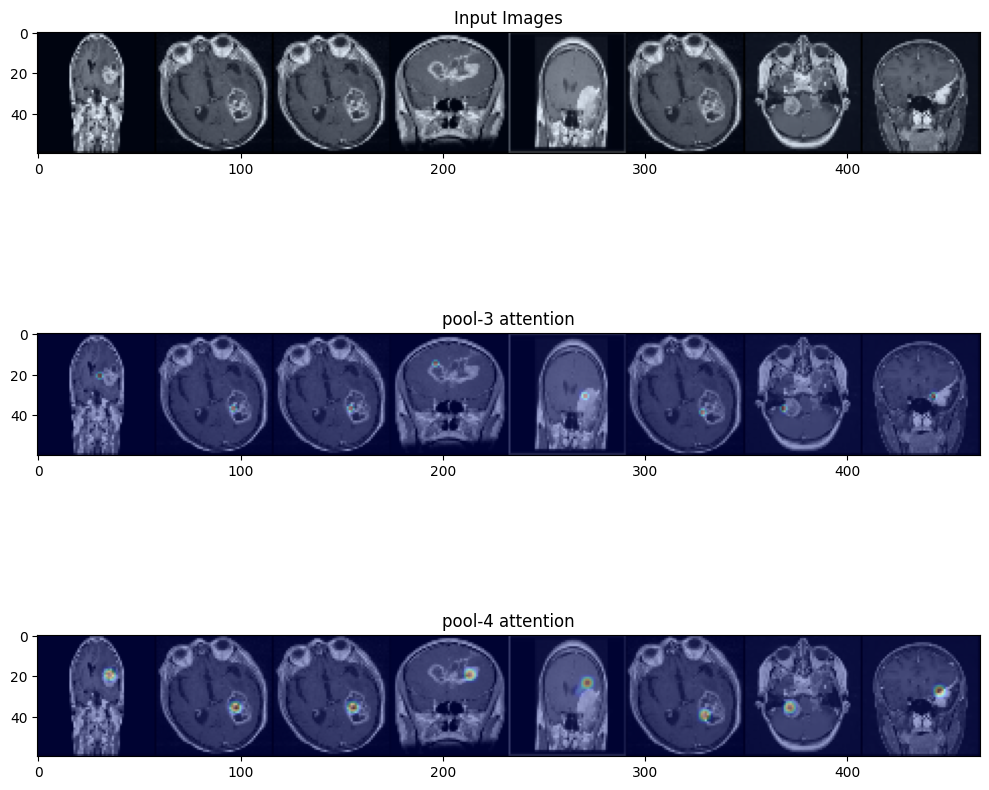

In [ ]:
import matplotlib.pyplot as plt

def unnormalize(img):
    mean = np.array([0.485, 0.456, 0.406])
    std = np.array([0.229, 0.224, 0.225])
    unnorm_img = img.cpu().numpy().transpose((1, 2, 0))
    unnorm_img = std * unnorm_img + mean
    unnorm_img = np.clip(unnorm_img, 0, 1)
    return unnorm_img

def combine_visualizations(I_train, a1, a2, up_factors=(2, 2, 4)):
    def visualize_attention(I_train, a, up_factor, no_attention=False):
      img = unnormalize(I_train)

# def combine_visualizations(I_train, a1, a2, up_factors=(2, 2, 4)):
#     def visualize_attention(I_train, a, up_factor, no_attention=False):
      img = I_train.permute((1,2,0)).cpu().numpy()
    # compute the heatmap
      if up_factor > 1:
        a = F.interpolate(a, scale_factor=up_factor, mode='bilinear', align_corners=False)
        attn = utils.make_grid(a, nrow=8, normalize=True, scale_each=True)
        attn = attn.permute((1,2,0)).mul(255).byte().cpu().numpy()
        attn = cv2.applyColorMap(attn, cv2.COLORMAP_JET)
        attn = cv2.cvtColor(attn, cv2.COLOR_BGR2RGB)
        attn = np.float32(attn) / 255
    # add the heatmap to the image
        img=cv2.resize(img,(466,60))
        if no_attention:
            return torch.from_numpy(img)
        else:
            vis = 0.7 * img + .3 * attn
            return torch.from_numpy(vis)
        # Your existing code for visualize_attention

    orig = visualize_attention(I_train, a1, up_factor=up_factors[0], no_attention=True)
    first = visualize_attention(I_train, a1, up_factor=up_factors[1], no_attention=False)
    second = visualize_attention(I_train, a2, up_factor=up_factors[2], no_attention=False)

    fig, (ax1, ax2, ax3) = plt.subplots(3, 1, figsize=(10, 10))
    ax1.imshow(orig)
    ax2.imshow(first)
    ax3.imshow(second)
    ax1.set_title('Input Images')
    ax2.set_title('pool-3 attention')
    ax3.set_title('pool-4 attention')

    plt.tight_layout()
    plt.show()


# Assuming X_train_batch is your input data
device = torch.device("cuda" if torch.cuda.is_available() else "cpu")

# Move the input data to the same device as the model

for batch_idx, (X_train_batch, _) in enumerate(test_loader):
    X_train_batch = X_train_batch.to(device)
    if batch_idx == 65:
        # Ensure the input batch is on the same device as the model
        X_train_batch = X_train_batch.to(device)

        I_train = utils.make_grid(X_train_batch[0:8, :, :, :], nrow=8, normalize=True, scale_each=True)
        _, a1, a2 = model(X_train_batch[0:8, :, :, :])
        break  # Stop the loop after getting the required batch

combine_visualizations(I_train, a1, a2, up_factors=(2, 2, 4))

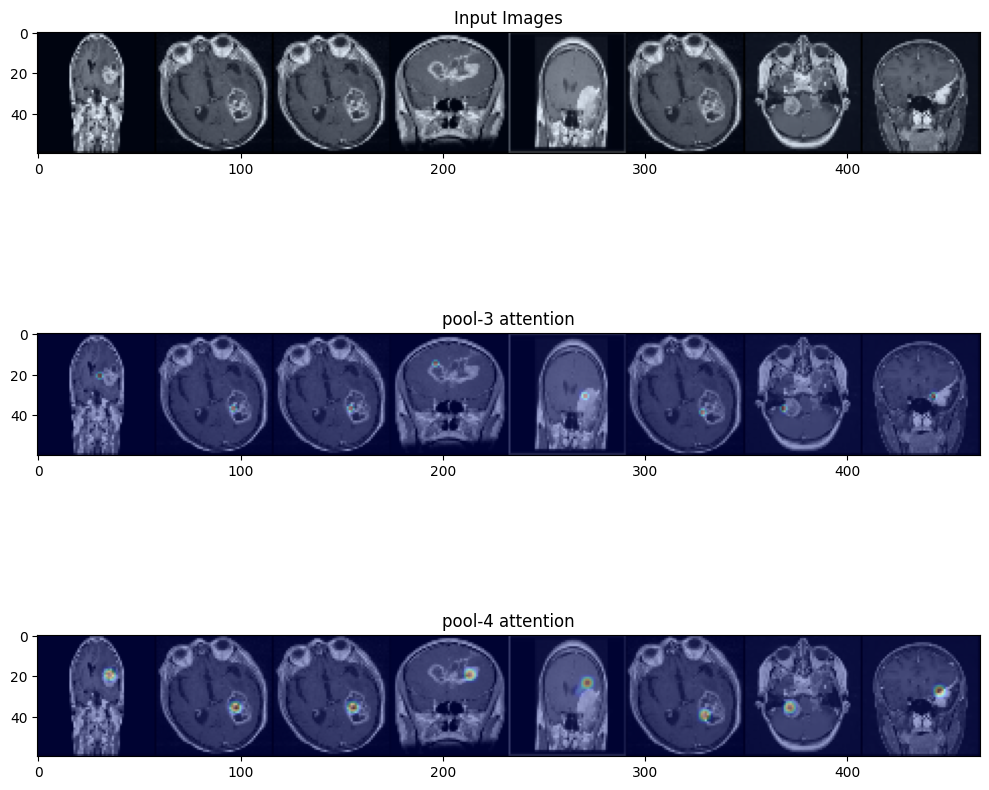

In [ ]:
import matplotlib.pyplot as plt

def unnormalize(img):
    mean = np.array([0.485, 0.456, 0.406])
    std = np.array([0.229, 0.224, 0.225])
    unnorm_img = img.cpu().numpy().transpose((1, 2, 0))
    unnorm_img = std * unnorm_img + mean
    unnorm_img = np.clip(unnorm_img, 0, 1)
    return unnorm_img

def combine_visualizations(I_train, a1, a2, up_factors=(2, 2, 4)):
    def visualize_attention(I_train, a, up_factor, no_attention=False):
      img = unnormalize(I_train)

# def combine_visualizations(I_train, a1, a2, up_factors=(2, 2, 4)):
#     def visualize_attention(I_train, a, up_factor, no_attention=False):
      img = I_train.permute((1,2,0)).cpu().numpy()
    # compute the heatmap
      if up_factor > 1:
        a = F.interpolate(a, scale_factor=up_factor, mode='bilinear', align_corners=False)
        attn = utils.make_grid(a, nrow=8, normalize=True, scale_each=True)
        attn = attn.permute((1,2,0)).mul(255).byte().cpu().numpy()
        attn = cv2.applyColorMap(attn, cv2.COLORMAP_JET)
        attn = cv2.cvtColor(attn, cv2.COLOR_BGR2RGB)
        attn = np.float32(attn) / 255
    # add the heatmap to the image
        img=cv2.resize(img,(466,60))
        if no_attention:
            return torch.from_numpy(img)
        else:
            vis = 0.7 * img + .3 * attn
            return torch.from_numpy(vis)
        # Your existing code for visualize_attention

    orig = visualize_attention(I_train, a1, up_factor=up_factors[0], no_attention=True)
    first = visualize_attention(I_train, a1, up_factor=up_factors[1], no_attention=False)
    second = visualize_attention(I_train, a2, up_factor=up_factors[2], no_attention=False)

    fig, (ax1, ax2, ax3) = plt.subplots(3, 1, figsize=(10, 10))
    ax1.imshow(orig)
    ax2.imshow(first)
    ax3.imshow(second)
    ax1.set_title('Input Images')
    ax2.set_title('pool-3 attention')
    ax3.set_title('pool-4 attention')

    plt.tight_layout()
    plt.show()


# Assuming X_train_batch is your input data
device = torch.device("cuda" if torch.cuda.is_available() else "cpu")

# Move the input data to the same device as the model

for batch_idx, (X_train_batch, _) in enumerate(test_loader):
    X_train_batch = X_train_batch.to(device)
    if batch_idx == 22:
        # Ensure the input batch is on the same device as the model
        X_train_batch = X_train_batch.to(device)

        I_train = utils.make_grid(X_train_batch[0:8, :, :, :], nrow=8, normalize=True, scale_each=True)
        _, a1, a2 = model(X_train_batch[0:8, :, :, :])
        break  # Stop the loop after getting the required batch

combine_visualizations(I_train, a1, a2, up_factors=(2, 2, 4))

#save model

In [ ]:
SAVE_PATH = os.path.join("/content", 'brain_att_A100' + ".pt")
# save model
torch.save(model, SAVE_PATH)

In [ ]:
from google.colab import drive
drive.mount('/content/drive')

Mounted at /content/drive


In [ ]:
SAVE_PATH = os.path.join("/content/drive/MyDrive", 'brain_att_A100' + ".pt")
# save model
torch.save(model, SAVE_PATH)

In [ ]:
net = torch.load('/content/drive/MyDrive/brain_att.pt')

net.eval()

AttnVGG(
  (conv_block1): Sequential(
    (0): Conv2d(3, 64, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
    (1): BatchNorm2d(64, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
    (2): ReLU(inplace=True)
    (3): Conv2d(64, 64, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
    (4): BatchNorm2d(64, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
    (5): ReLU(inplace=True)
  )
  (conv_block2): Sequential(
    (0): Conv2d(64, 128, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
    (1): BatchNorm2d(128, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
    (2): ReLU(inplace=True)
    (3): Conv2d(128, 128, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
    (4): BatchNorm2d(128, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
    (5): ReLU(inplace=True)
  )
  (conv_block3): Sequential(
    (0): Conv2d(128, 256, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
    (1): BatchNorm2d(256, eps=1e-05, momentum=0

In [ ]:
class_names = train_data.classes
class_names

['glioma_tumor', 'meningioma_tumor', 'no_tumor', 'pituitary_tumor']

In [ ]:
import torch
from torchvision import transforms
from PIL import Image

# Load a pre-trained Image Transformer model
device = torch.device("cuda" if torch.cuda.is_available() else "cpu")
# Set the model to evaluation mode
model = net
model.eval()
vgg16_mean = [0.485, 0.456, 0.406]
vgg16_std = [0.229, 0.224, 0.225]
# Function to predict using the loaded model
def predict_image(image_path):
    try:
        image = Image.open(image_path).convert('RGB')  # Load the image using PIL and ensure it's RGB
        preprocess = transforms.Compose([
            transforms.Resize((224, 224)),  # Resize images to the size required by the model
            transforms.ToTensor(),  # Convert PIL images to tensors
            transforms.Normalize(mean=vgg16_mean, std=vgg16_std)  # Normalize for VGG16
        ])
        image_tensor = preprocess(image).unsqueeze(0).to(device)  # Preprocess the image and move to device

        # Perform inference
        with torch.no_grad():
            outputs = model(image_tensor)  # Get predictions from the model
            _, predicted = torch.max(outputs, 1)  # Assuming it's a classification task

            # Return the predicted class
            return predicted.item()  # Assuming a single image prediction
    except Exception as e:
        print(f"Error processing the image: {e}")
        return None

# Example usage:
image_path = '/content/Brain-Tumor-Classification-DataSet/Testing/meningioma_tumor/image.jpg'  # Replace with the path to your image
predicted_class = predict_image(image_path)
print(f"Predicted Class: {predicted_class}")


Error processing the image: max() received an invalid combination of arguments - got (list, int), but expected one of:
 * (Tensor input, *, Tensor out)
 * (Tensor input, Tensor other, *, Tensor out)
 * (Tensor input, int dim, bool keepdim, *, tuple of Tensors out)
 * (Tensor input, name dim, bool keepdim, *, tuple of Tensors out)

Predicted Class: None


In [ ]:

# Define the normalization for VGG16
vgg16_mean = [0.485, 0.456, 0.406]
vgg16_std = [0.229, 0.224, 0.225]

preprocess = transforms.Compose([
    transforms.Resize((224, 224)),  # Resize images to the size required by VGG16
    transforms.ToTensor(),  # Convert PIL images to tensors
    transforms.Normalize(mean=vgg16_mean, std=vgg16_std)  # Normalize for VGG16
])

# Function to predict using the loaded VGG16 model
def predict_image_vgg16(image_path):
    try:
        image = Image.open(image_path).convert('RGB')  # Load the image using PIL and ensure it's RGB

        # Ensure consistent resizing before applying other transformations
        image = image.resize((224, 224))

        image_tensor = preprocess(image).unsqueeze(0).to(device)  # Preprocess the image and move to device

        # Perform inference
        with torch.no_grad():
            outputs = model(image_tensor)  # Get predictions from the model
            _, predicted = torch.max(outputs, 1)  # Assuming it's a classification task

            # Return the predicted class
            return predicted.item()  # Assuming a single image prediction
    except Exception as e:
        print(f"Error processing the image: {e}")
        return None

# Example usage:
image_path = '/content/Brain-Tumor-Classification-DataSet/Testing/meningioma_tumor/image(106).jpg'  # Replace with the path to your image
predicted_class = predict_image_vgg16(image_path)
print(f"Predicted Class: {predicted_class}")


Error processing the image: max() received an invalid combination of arguments - got (list, int), but expected one of:
 * (Tensor input, *, Tensor out)
 * (Tensor input, Tensor other, *, Tensor out)
 * (Tensor input, int dim, bool keepdim, *, tuple of Tensors out)
 * (Tensor input, name dim, bool keepdim, *, tuple of Tensors out)

Predicted Class: None


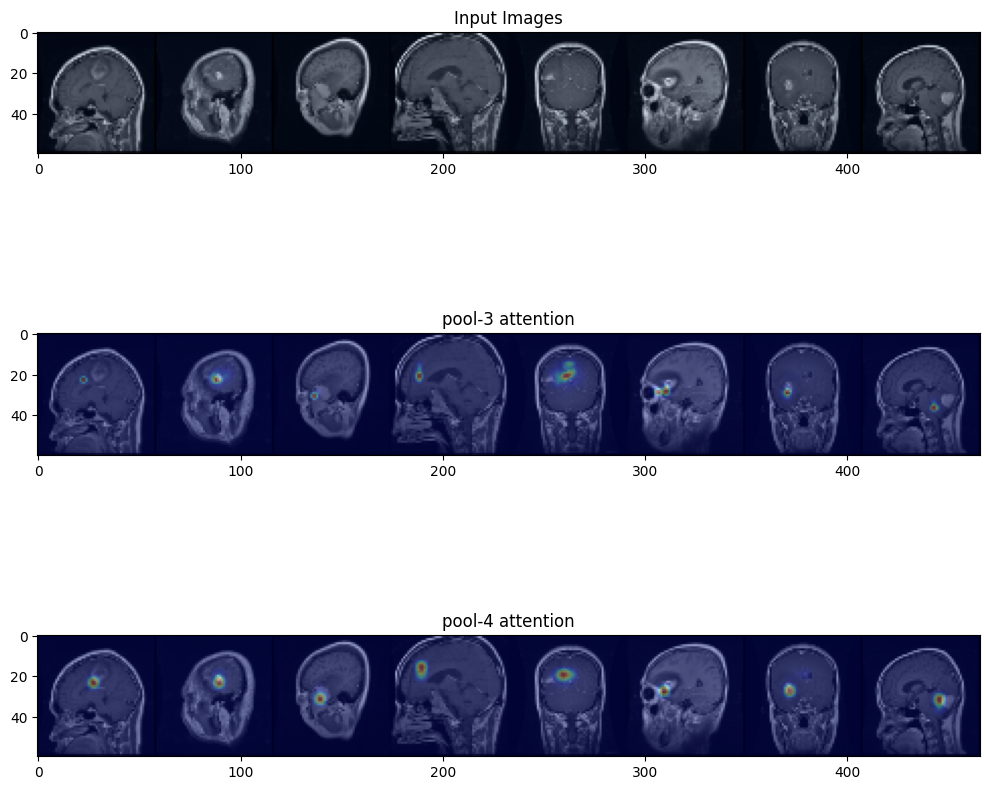

In [ ]:
import matplotlib.pyplot as plt

def unnormalize(img):
    mean = np.array([0.485, 0.456, 0.406])
    std = np.array([0.229, 0.224, 0.225])
    unnorm_img = img.cpu().numpy().transpose((1, 2, 0))
    unnorm_img = std * unnorm_img + mean
    unnorm_img = np.clip(unnorm_img, 0, 1)
    return unnorm_img

def combine_visualizations(I_train, a1, a2, up_factors=(2, 2, 4)):
    def visualize_attention(I_train, a, up_factor, no_attention=False):
      img = unnormalize(I_train)

# def combine_visualizations(I_train, a1, a2, up_factors=(2, 2, 4)):
#     def visualize_attention(I_train, a, up_factor, no_attention=False):
      img = I_train.permute((1,2,0)).cpu().numpy()
    # compute the heatmap
      if up_factor > 1:
        a = F.interpolate(a, scale_factor=up_factor, mode='bilinear', align_corners=False)
        attn = utils.make_grid(a, nrow=8, normalize=True, scale_each=True)
        attn = attn.permute((1,2,0)).mul(255).byte().cpu().numpy()
        attn = cv2.applyColorMap(attn, cv2.COLORMAP_JET)
        attn = cv2.cvtColor(attn, cv2.COLOR_BGR2RGB)
        attn = np.float32(attn) / 255
    # add the heatmap to the image
        img=cv2.resize(img,(466,60))
        if no_attention:
            return torch.from_numpy(img)
        else:
            vis = 0.7 * img + .3 * attn
            return torch.from_numpy(vis)
        # Your existing code for visualize_attention

    orig = visualize_attention(I_train, a1, up_factor=up_factors[0], no_attention=True)
    first = visualize_attention(I_train, a1, up_factor=up_factors[1], no_attention=False)
    second = visualize_attention(I_train, a2, up_factor=up_factors[2], no_attention=False)

    fig, (ax1, ax2, ax3) = plt.subplots(3, 1, figsize=(10, 10))
    ax1.imshow(orig)
    ax2.imshow(first)
    ax3.imshow(second)
    ax1.set_title('Input Images')
    ax2.set_title('pool-3 attention')
    ax3.set_title('pool-4 attention')

    plt.tight_layout()
    plt.show()


# Assuming X_train_batch is your input data
device = torch.device("cuda" if torch.cuda.is_available() else "cpu")

# Move the input data to the same device as the model

for batch_idx, (X_train_batch, _) in enumerate(test_loader):
    X_train_batch = X_train_batch.to(device)
    if batch_idx == 30:
        # Ensure the input batch is on the same device as the model
        X_train_batch = X_train_batch.to(device)

        I_train = utils.make_grid(X_train_batch[0:8, :, :, :], nrow=8, normalize=True, scale_each=True)
        _, a1, a2 = model(X_train_batch[0:8, :, :, :])
        break  # Stop the loop after getting the required batch

combine_visualizations(I_train, a1, a2, up_factors=(2, 2, 4))

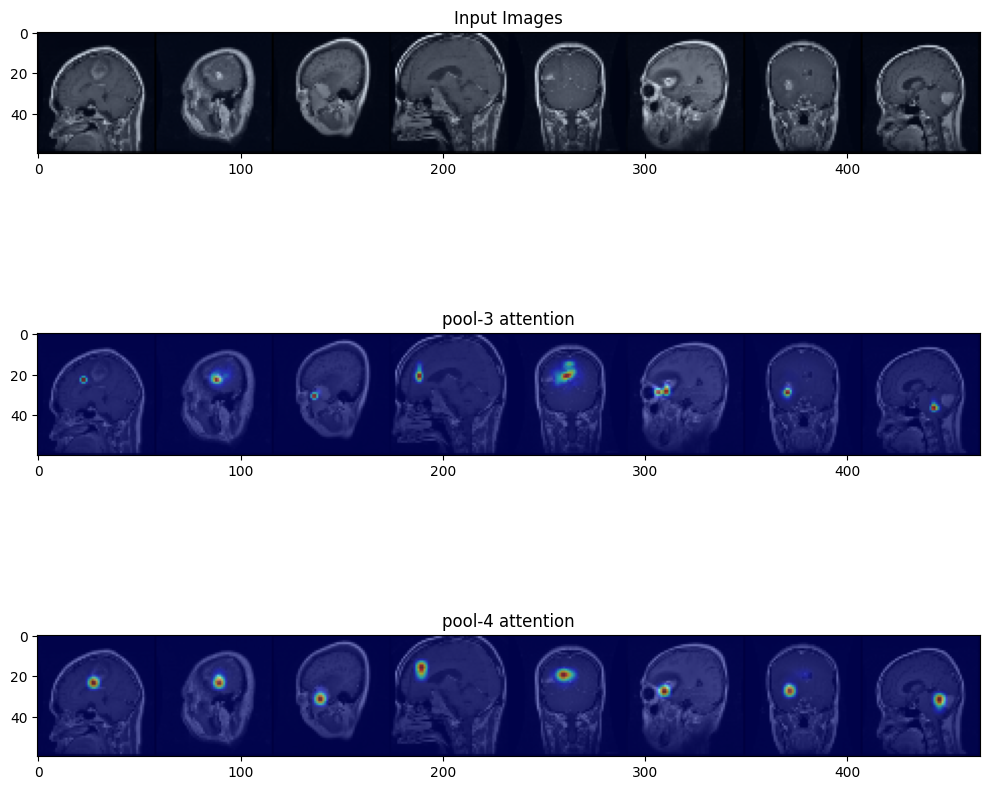

In [ ]:
import matplotlib.pyplot as plt

def unnormalize(img):
    mean = np.array([0.485, 0.456, 0.406])
    std = np.array([0.229, 0.224, 0.225])
    unnorm_img = img.cpu().numpy().transpose((1, 2, 0))
    unnorm_img = std * unnorm_img + mean
    unnorm_img = np.clip(unnorm_img, 0, 1)
    return unnorm_img

def combine_visualizations(I_train, a1, a2, up_factors=(2, 2, 4)):
    def visualize_attention(I_train, a, up_factor, no_attention=False):
      img = unnormalize(I_train)

# def combine_visualizations(I_train, a1, a2, up_factors=(2, 2, 4)):
#     def visualize_attention(I_train, a, up_factor, no_attention=False):
      img = I_train.permute((1,2,0)).cpu().numpy()
    # compute the heatmap
      if up_factor > 1:
        a = F.interpolate(a, scale_factor=up_factor, mode='bilinear', align_corners=False)
        attn = utils.make_grid(a, nrow=8, normalize=True, scale_each=True)
        attn = attn.permute((1,2,0)).mul(255).byte().cpu().numpy()
        attn = cv2.applyColorMap(attn, cv2.COLORMAP_JET)
        attn = cv2.cvtColor(attn, cv2.COLOR_BGR2RGB)
        attn = np.float32(attn) / 255
    # add the heatmap to the image
        img=cv2.resize(img,(466,60))
        if no_attention:
            return torch.from_numpy(img)
        else:
            vis = 0.5 * img + .5 * attn
            return torch.from_numpy(vis)
        # Your existing code for visualize_attention

    orig = visualize_attention(I_train, a1, up_factor=up_factors[0], no_attention=True)
    first = visualize_attention(I_train, a1, up_factor=up_factors[1], no_attention=False)
    second = visualize_attention(I_train, a2, up_factor=up_factors[2], no_attention=False)

    fig, (ax1, ax2, ax3) = plt.subplots(3, 1, figsize=(10, 10))
    ax1.imshow(orig)
    ax2.imshow(first)
    ax3.imshow(second)
    ax1.set_title('Input Images')
    ax2.set_title('pool-3 attention')
    ax3.set_title('pool-4 attention')

    plt.tight_layout()
    plt.show()


# Assuming X_train_batch is your input data
device = torch.device("cuda" if torch.cuda.is_available() else "cpu")

# Move the input data to the same device as the model

for batch_idx, (X_train_batch, _) in enumerate(test_loader):
    X_train_batch = X_train_batch.to(device)
    if batch_idx == 70:
        # Ensure the input batch is on the same device as the model
        X_train_batch = X_train_batch.to(device)

        I_train = utils.make_grid(X_train_batch[0:8, :, :, :], nrow=8, normalize=True, scale_each=True)
        _, a1, a2 = model(X_train_batch[0:8, :, :, :])
        break  # Stop the loop after getting the required batch

combine_visualizations(I_train, a1, a2, up_factors=(2, 2, 4))

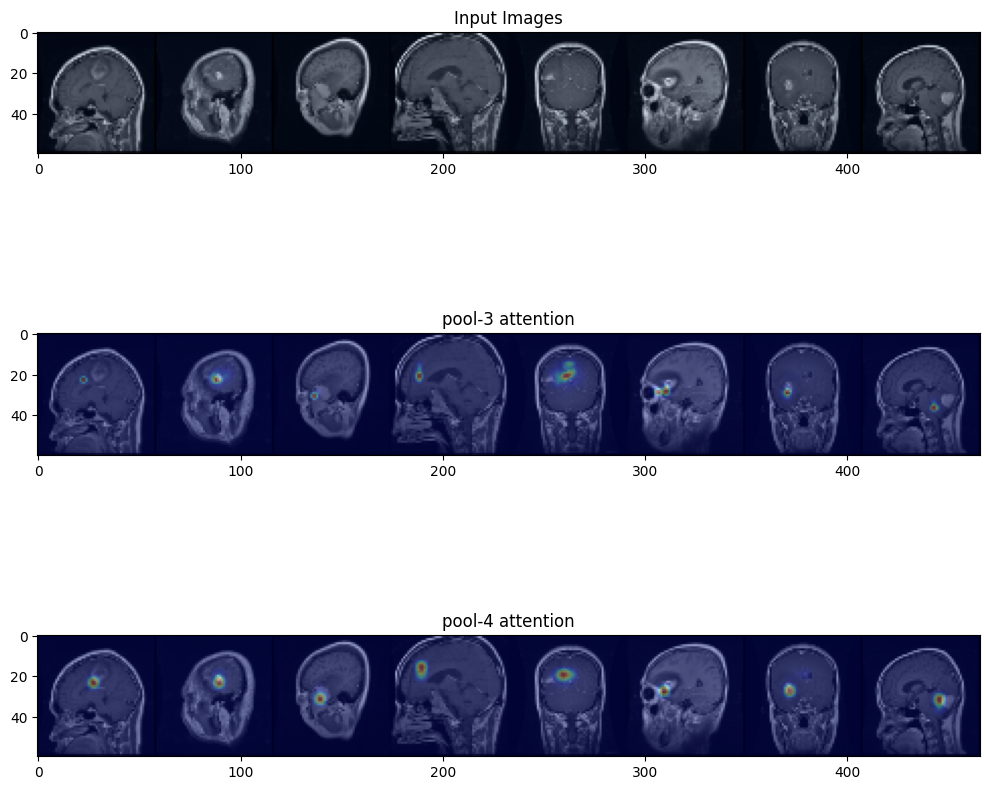

In [ ]:
import matplotlib.pyplot as plt

def unnormalize(img):
    mean = np.array([0.485, 0.456, 0.406])
    std = np.array([0.229, 0.224, 0.225])
    unnorm_img = img.cpu().numpy().transpose((1, 2, 0))
    unnorm_img = std * unnorm_img + mean
    unnorm_img = np.clip(unnorm_img, 0, 1)
    return unnorm_img

def combine_visualizations(I_train, a1, a2, up_factors=(2, 2, 4)):
    def visualize_attention(I_train, a, up_factor, no_attention=False):
      img = unnormalize(I_train)

# def combine_visualizations(I_train, a1, a2, up_factors=(2, 2, 4)):
#     def visualize_attention(I_train, a, up_factor, no_attention=False):
      img = I_train.permute((1,2,0)).cpu().numpy()
    # compute the heatmap
      if up_factor > 1:
        a = F.interpolate(a, scale_factor=up_factor, mode='bilinear', align_corners=False)
        attn = utils.make_grid(a, nrow=8, normalize=True, scale_each=True)
        attn = attn.permute((1,2,0)).mul(255).byte().cpu().numpy()
        attn = cv2.applyColorMap(attn, cv2.COLORMAP_JET)
        attn = cv2.cvtColor(attn, cv2.COLOR_BGR2RGB)
        attn = np.float32(attn) / 255
    # add the heatmap to the image
        img=cv2.resize(img,(466,60))
        if no_attention:
            return torch.from_numpy(img)
        else:
            vis = 0.7 * img + .3 * attn
            return torch.from_numpy(vis)
        # Your existing code for visualize_attention

    orig = visualize_attention(I_train, a1, up_factor=up_factors[0], no_attention=True)
    first = visualize_attention(I_train, a1, up_factor=up_factors[1], no_attention=False)
    second = visualize_attention(I_train, a2, up_factor=up_factors[2], no_attention=False)

    fig, (ax1, ax2, ax3) = plt.subplots(3, 1, figsize=(10, 10))
    ax1.imshow(orig)
    ax2.imshow(first)
    ax3.imshow(second)
    ax1.set_title('Input Images')
    ax2.set_title('pool-3 attention')
    ax3.set_title('pool-4 attention')

    plt.tight_layout()
    plt.show()


# Assuming X_train_batch is your input data
device = torch.device("cuda" if torch.cuda.is_available() else "cpu")

# Move the input data to the same device as the model

for batch_idx, (X_train_batch, _) in enumerate(test_loader):
    X_train_batch = X_train_batch.to(device)
    if batch_idx == 64:
        # Ensure the input batch is on the same device as the model
        X_train_batch = X_train_batch.to(device)

        I_train = utils.make_grid(X_train_batch[0:8, :, :, :], nrow=8, normalize=True, scale_each=True)
        _, a1, a2 = model(X_train_batch[0:8, :, :, :])
        break  # Stop the loop after getting the required batch

combine_visualizations(I_train, a1, a2, up_factors=(2, 2, 4))

#Jacobgil

In [ ]:
!pip install git+https://github.com/jacobgil/pytorch-grad-cam.git

  Cloning https://github.com/jacobgil/pytorch-grad-cam.git to /tmp/pip-req-build-q3kjtm2p
  Running command git clone --filter=blob:none --quiet https://github.com/jacobgil/pytorch-grad-cam.git /tmp/pip-req-build-q3kjtm2p
  Resolved https://github.com/jacobgil/pytorch-grad-cam.git to commit 51ae19245f655cf0ee334db2a945ceb1a4d6df59
  Installing build dependencies ... done
  Getting requirements to build wheel ... done
  Preparing metadata (pyproject.toml) ... done
  Created wheel for grad-cam: filename=grad_cam-1.5.0-py3-none-any.whl size=37432 sha256=b755467722bf214d518cd658e1dc1d31033a4c271f06cc4dadf746d81d832768
  Stored in directory: /tmp/pip-ephem-wheel-cache-r31z8crx/wheels/23/11/66/71a38b0c29ba4ec5f62105a2145278613855bc9c94eecf630d
Successfully built grad-cam


In [ ]:
import copy
from pytorch_grad_cam import GradCAM, ScoreCAM, GradCAMPlusPlus, AblationCAM, XGradCAM, EigenCAM, FullGrad, HiResCAM
from pytorch_grad_cam.utils.model_targets import ClassifierOutputTarget
from pytorch_grad_cam.utils.image import show_cam_on_image, \
    deprocess_image,\
    preprocess_image
from torchvision.models import resnet18
import numpy as np
from PIL import Image
import torch
import torch.nn as nn
import torchvision
import requests
import cv2

In [ ]:
#test 1,(3) #m

model.eval()

import torch
from torchvision import transforms
from PIL import Image

def predict_probabilities(model, path):
    device = torch.device("cuda" if torch.cuda.is_available() else "cpu")
    transform = transforms.Compose([
        transforms.Resize((224, 224)),
        transforms.ToTensor(),
        transforms.Normalize(mean=[0.485, 0.456, 0.406], std=[0.229, 0.224, 0.225]),
    ])

    image = Image.open(path)
    input_image = transform(image).unsqueeze(0).to(device)  # Add a batch dimension and move to device

    with torch.no_grad():
        output, _, _ = model(input_image)

    probabilities = torch.nn.functional.softmax(output[0], dim=0)
    return probabilities.cpu().numpy()

# Path to the single image
path = '/content/Brain-Tumor-Classification-DataSet/Testing/glioma_tumor/image(19).jpg'
# Load your pre-trained ResNet model
model.eval()

# Ensure the model is on the same device as the input data
device = torch.device("cuda" if torch.cuda.is_available() else "cpu")
model.to(device)

# Get the probabilities for the single image
probabilities = predict_probabilities(model, path)

# Print the probabilities for the single image
print("Probabilities for the Image:")
print(probabilities)

Probabilities for the Image:
[1.0713997e-04 9.9989140e-01 1.4610148e-06]


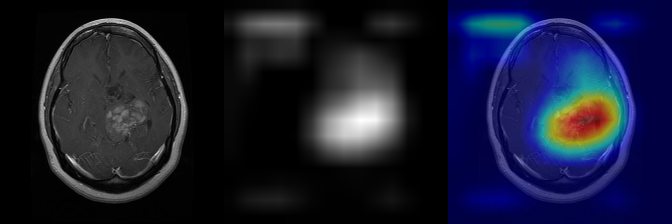

In [ ]:
image_url = '/content/Brain-Tumor-Classification-DataSet/Training/glioma_tumor/gg (1).jpg'
img = np.array(Image.open(image_url))
img = cv2.resize(img, (224, 224))
img = np.float32(img) / 255
input_tensor = preprocess_image(img, mean=[0.485, 0.456, 0.406], std=[0.229, 0.224, 0.225])
model.eval()
target_layers = [model.conv_block5]
targets = [ClassifierOutputTarget(0)]

with GradCAM(model=model, target_layers=target_layers) as cam:
    grayscale_cams = cam(input_tensor=input_tensor, targets=targets)
    cam_image = show_cam_on_image(img, grayscale_cams[0, :], use_rgb=True)
cam = np.uint8(255*grayscale_cams[0, :])

cam = cv2.merge([cam, cam, cam])
images = np.hstack((np.uint8(255*img), cam , cam_image))
Image.fromarray(images)

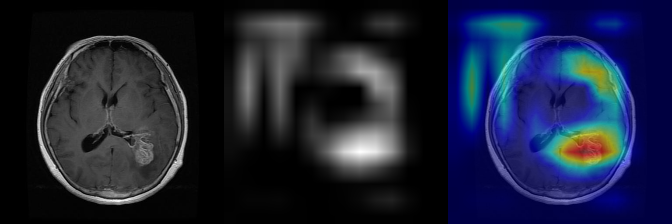

In [ ]:
image_url = '/content/Brain-Tumor-Classification-DataSet/Training/glioma_tumor/gg (10).jpg'
img = np.array(Image.open(image_url))
img = cv2.resize(img, (224, 224))
img = np.float32(img) / 255
input_tensor = preprocess_image(img, mean=[0.485, 0.456, 0.406], std=[0.229, 0.224, 0.225])
model.eval()
target_layers = [model.conv_block5]
targets = [ClassifierOutputTarget(0)]

with GradCAM(model=model, target_layers=target_layers) as cam:
    grayscale_cams = cam(input_tensor=input_tensor, targets=targets)
    cam_image = show_cam_on_image(img, grayscale_cams[0, :], use_rgb=True)
cam = np.uint8(255*grayscale_cams[0, :])

cam = cv2.merge([cam, cam, cam])
images = np.hstack((np.uint8(255*img), cam , cam_image))
Image.fromarray(images)

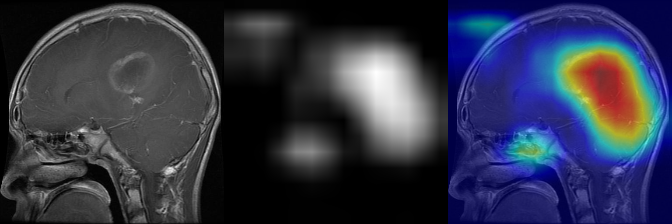

In [ ]:
image_url = '/content/Brain-Tumor-Classification-DataSet/Training/glioma_tumor/gg (112).jpg'
img = np.array(Image.open(image_url))
img = cv2.resize(img, (224, 224))
img = np.float32(img) / 255
input_tensor = preprocess_image(img, mean=[0.485, 0.456, 0.406], std=[0.229, 0.224, 0.225])
model.eval()
target_layers = [model.conv_block5]
targets = [ClassifierOutputTarget(0)]

with GradCAM(model=model, target_layers=target_layers) as cam:
    grayscale_cams = cam(input_tensor=input_tensor, targets=targets)
    cam_image = show_cam_on_image(img, grayscale_cams[0, :], use_rgb=True)
cam = np.uint8(255*grayscale_cams[0, :])

cam = cv2.merge([cam, cam, cam])
images = np.hstack((np.uint8(255*img), cam , cam_image))
Image.fromarray(images)

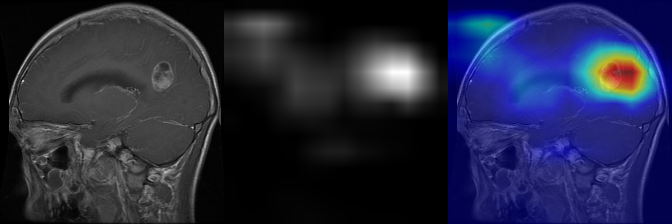

In [ ]:
image_url = '/content/Brain-Tumor-Classification-DataSet/Training/glioma_tumor/gg (114).jpg'
img = np.array(Image.open(image_url))
img = cv2.resize(img, (224, 224))
img = np.float32(img) / 255
input_tensor = preprocess_image(img, mean=[0.485, 0.456, 0.406], std=[0.229, 0.224, 0.225])
model.eval()
target_layers = [model.conv_block5]
targets = [ClassifierOutputTarget(0)]

with GradCAM(model=model, target_layers=target_layers) as cam:
    grayscale_cams = cam(input_tensor=input_tensor, targets=targets)
    cam_image = show_cam_on_image(img, grayscale_cams[0, :], use_rgb=True)
cam = np.uint8(255*grayscale_cams[0, :])

cam = cv2.merge([cam, cam, cam])
images = np.hstack((np.uint8(255*img), cam , cam_image))
Image.fromarray(images)

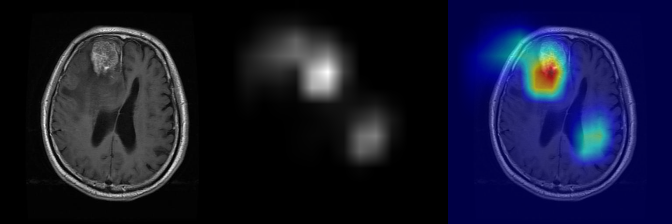

In [ ]:
#meningimo

image_url = '/content/Brain-Tumor-Classification-DataSet/Training/meningioma_tumor/m (138).jpg'
img = np.array(Image.open(image_url))
img = cv2.resize(img, (224, 224))
img = np.float32(img) / 255
input_tensor = preprocess_image(img, mean=[0.485, 0.456, 0.406], std=[0.229, 0.224, 0.225])
model.eval()
target_layers = [model.conv_block5]
targets = [ClassifierOutputTarget(1)]

with GradCAM(model=model, target_layers=target_layers) as cam:
    grayscale_cams = cam(input_tensor=input_tensor, targets=targets)
    cam_image = show_cam_on_image(img, grayscale_cams[0, :], use_rgb=True)
cam = np.uint8(255*grayscale_cams[0, :])

cam = cv2.merge([cam, cam, cam])
images = np.hstack((np.uint8(255*img), cam , cam_image))
Image.fromarray(images)

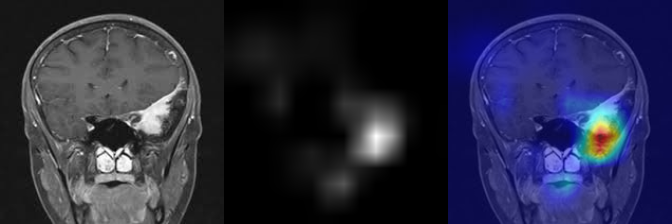

In [ ]:
#meningimo

image_url = '/content/Brain-Tumor-Classification-DataSet/Testing/meningioma_tumor/image(102).jpg'
img = np.array(Image.open(image_url))
img = cv2.resize(img, (224, 224))
img = np.float32(img) / 255
input_tensor = preprocess_image(img, mean=[0.485, 0.456, 0.406], std=[0.229, 0.224, 0.225])
model.eval()
target_layers = [model.conv_block5]
targets = [ClassifierOutputTarget(1)]

with GradCAM(model=model, target_layers=target_layers) as cam:
    grayscale_cams = cam(input_tensor=input_tensor, targets=targets)
    cam_image = show_cam_on_image(img, grayscale_cams[0, :], use_rgb=True)
cam = np.uint8(255*grayscale_cams[0, :])

cam = cv2.merge([cam, cam, cam])
images = np.hstack((np.uint8(255*img), cam , cam_image))
Image.fromarray(images)

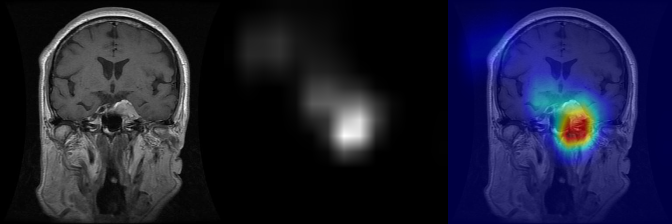

In [ ]:
#meningimo

image_url = '/content/Brain-Tumor-Classification-DataSet/Training/meningioma_tumor/m (17).jpg'
img = np.array(Image.open(image_url))
img = cv2.resize(img, (224, 224))
img = np.float32(img) / 255
input_tensor = preprocess_image(img, mean=[0.485, 0.456, 0.406], std=[0.229, 0.224, 0.225])
model.eval()
target_layers = [model.conv_block5]
targets = [ClassifierOutputTarget(1)]

with GradCAM(model=model, target_layers=target_layers) as cam:
    grayscale_cams = cam(input_tensor=input_tensor, targets=targets)
    cam_image = show_cam_on_image(img, grayscale_cams[0, :], use_rgb=True)
cam = np.uint8(255*grayscale_cams[0, :])

cam = cv2.merge([cam, cam, cam])
images = np.hstack((np.uint8(255*img), cam , cam_image))
Image.fromarray(images)

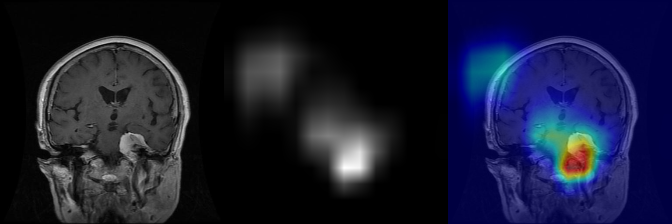

In [ ]:
#meningimo

image_url = '/content/Brain-Tumor-Classification-DataSet/Training/meningioma_tumor/m (31).jpg'
img = np.array(Image.open(image_url))
img = cv2.resize(img, (224, 224))
img = np.float32(img) / 255
input_tensor = preprocess_image(img, mean=[0.485, 0.456, 0.406], std=[0.229, 0.224, 0.225])
model.eval()
target_layers = [model.conv_block5]
targets = [ClassifierOutputTarget(1)]

with GradCAM(model=model, target_layers=target_layers) as cam:
    grayscale_cams = cam(input_tensor=input_tensor, targets=targets)
    cam_image = show_cam_on_image(img, grayscale_cams[0, :], use_rgb=True)
cam = np.uint8(255*grayscale_cams[0, :])

cam = cv2.merge([cam, cam, cam])
images = np.hstack((np.uint8(255*img), cam , cam_image))
Image.fromarray(images)

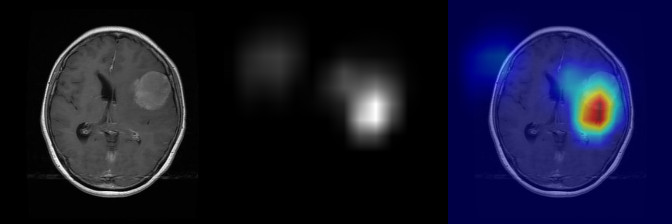

In [ ]:
#meningimo

image_url = '/content/Brain-Tumor-Classification-DataSet/Training/meningioma_tumor/m (172).jpg'
img = np.array(Image.open(image_url))
img = cv2.resize(img, (224, 224))
img = np.float32(img) / 255
input_tensor = preprocess_image(img, mean=[0.485, 0.456, 0.406], std=[0.229, 0.224, 0.225])
model.eval()
target_layers = [model.conv_block5]
targets = [ClassifierOutputTarget(1)]

with GradCAM(model=model, target_layers=target_layers) as cam:
    grayscale_cams = cam(input_tensor=input_tensor, targets=targets)
    cam_image = show_cam_on_image(img, grayscale_cams[0, :], use_rgb=True)
cam = np.uint8(255*grayscale_cams[0, :])

cam = cv2.merge([cam, cam, cam])
images = np.hstack((np.uint8(255*img), cam , cam_image))
Image.fromarray(images)

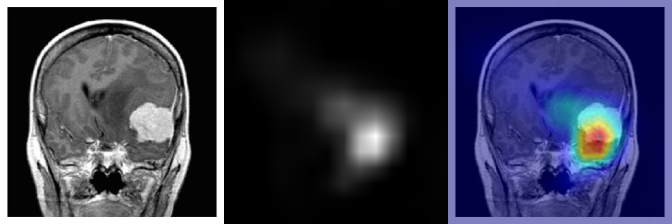

In [ ]:
#meningimo

image_url = '/content/Brain-Tumor-Classification-DataSet/Testing/meningioma_tumor/image(123).jpg'
img = np.array(Image.open(image_url))
img = cv2.resize(img, (224, 224))
img = np.float32(img) / 255
input_tensor = preprocess_image(img, mean=[0.485, 0.456, 0.406], std=[0.229, 0.224, 0.225])
model.eval()
target_layers = [model.conv_block5]
targets = [ClassifierOutputTarget(1)]

with GradCAM(model=model, target_layers=target_layers) as cam:
    grayscale_cams = cam(input_tensor=input_tensor, targets=targets)
    cam_image = show_cam_on_image(img, grayscale_cams[0, :], use_rgb=True)
cam = np.uint8(255*grayscale_cams[0, :])

cam = cv2.merge([cam, cam, cam])
images = np.hstack((np.uint8(255*img), cam , cam_image))
Image.fromarray(images)

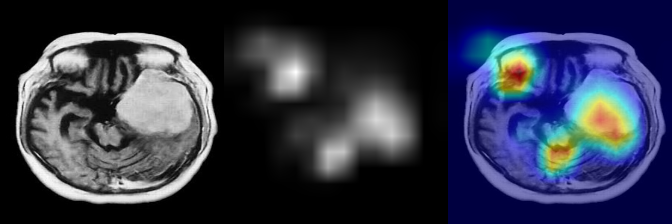

In [ ]:
#meningimo

image_url = '/content/Brain-Tumor-Classification-DataSet/Testing/meningioma_tumor/image(28).jpg'
img = np.array(Image.open(image_url))
img = cv2.resize(img, (224, 224))
img = np.float32(img) / 255
input_tensor = preprocess_image(img, mean=[0.485, 0.456, 0.406], std=[0.229, 0.224, 0.225])
model.eval()
target_layers = [model.conv_block5]
targets = [ClassifierOutputTarget(1)]

with GradCAM(model=model, target_layers=target_layers) as cam:
    grayscale_cams = cam(input_tensor=input_tensor, targets=targets)
    cam_image = show_cam_on_image(img, grayscale_cams[0, :], use_rgb=True)
cam = np.uint8(255*grayscale_cams[0, :])

cam = cv2.merge([cam, cam, cam])
images = np.hstack((np.uint8(255*img), cam , cam_image))
Image.fromarray(images)

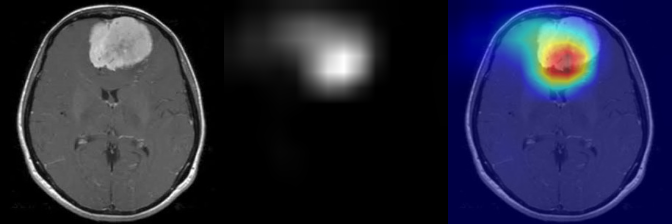

In [ ]:
#meningimo

image_url = '/content/Brain-Tumor-Classification-DataSet/Testing/meningioma_tumor/image(66).jpg'
img = np.array(Image.open(image_url))
img = cv2.resize(img, (224, 224))
img = np.float32(img) / 255
input_tensor = preprocess_image(img, mean=[0.485, 0.456, 0.406], std=[0.229, 0.224, 0.225])
model.eval()
target_layers = [model.conv_block5]
targets = [ClassifierOutputTarget(1)]

with GradCAM(model=model, target_layers=target_layers) as cam:
    grayscale_cams = cam(input_tensor=input_tensor, targets=targets)
    cam_image = show_cam_on_image(img, grayscale_cams[0, :], use_rgb=True)
cam = np.uint8(255*grayscale_cams[0, :])

cam = cv2.merge([cam, cam, cam])
images = np.hstack((np.uint8(255*img), cam , cam_image))
Image.fromarray(images)

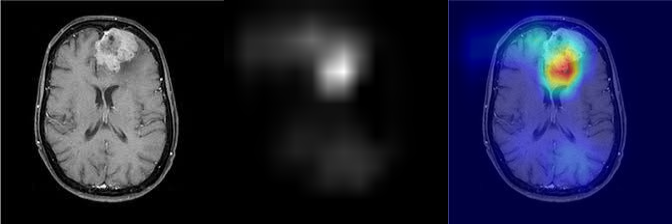

In [ ]:
#meningimo

image_url = '/content/Brain-Tumor-Classification-DataSet/Testing/meningioma_tumor/image(99).jpg'
img = np.array(Image.open(image_url))
img = cv2.resize(img, (224, 224))
img = np.float32(img) / 255
input_tensor = preprocess_image(img, mean=[0.485, 0.456, 0.406], std=[0.229, 0.224, 0.225])
model.eval()
target_layers = [model.conv_block5]
targets = [ClassifierOutputTarget(1)]

with GradCAM(model=model, target_layers=target_layers) as cam:
    grayscale_cams = cam(input_tensor=input_tensor, targets=targets)
    cam_image = show_cam_on_image(img, grayscale_cams[0, :], use_rgb=True)
cam = np.uint8(255*grayscale_cams[0, :])

cam = cv2.merge([cam, cam, cam])
images = np.hstack((np.uint8(255*img), cam , cam_image))
Image.fromarray(images)

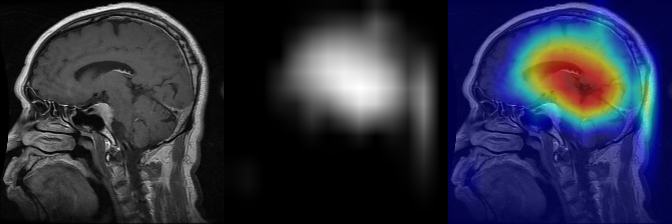

In [ ]:
#pit
#meningimo

image_url = '/content/Brain-Tumor-Classification-DataSet/Testing/pituitary_tumor/image(2).jpg'
img = np.array(Image.open(image_url))
img = cv2.resize(img, (224, 224))
img = np.float32(img) / 255
input_tensor = preprocess_image(img, mean=[0.485, 0.456, 0.406], std=[0.229, 0.224, 0.225])
model.eval()
target_layers = [model.conv_block5]
targets = [ClassifierOutputTarget(2)]

with GradCAM(model=model, target_layers=target_layers) as cam:
    grayscale_cams = cam(input_tensor=input_tensor, targets=targets)
    cam_image = show_cam_on_image(img, grayscale_cams[0, :], use_rgb=True)
cam = np.uint8(255*grayscale_cams[0, :])

cam = cv2.merge([cam, cam, cam])
images = np.hstack((np.uint8(255*img), cam , cam_image))
Image.fromarray(images)

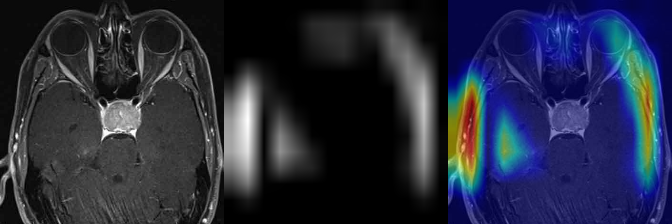

In [ ]:
#pit
#meningimo

image_url = '/content/Brain-Tumor-Classification-DataSet/Testing/pituitary_tumor/image(31).jpg'
img = np.array(Image.open(image_url))
img = cv2.resize(img, (224, 224))
img = np.float32(img) / 255
input_tensor = preprocess_image(img, mean=[0.485, 0.456, 0.406], std=[0.229, 0.224, 0.225])
model.eval()
target_layers = [model.conv_block5]
targets = [ClassifierOutputTarget(2)]

with GradCAM(model=model, target_layers=target_layers) as cam:
    grayscale_cams = cam(input_tensor=input_tensor, targets=targets)
    cam_image = show_cam_on_image(img, grayscale_cams[0, :], use_rgb=True)
cam = np.uint8(255*grayscale_cams[0, :])

cam = cv2.merge([cam, cam, cam])
images = np.hstack((np.uint8(255*img), cam , cam_image))
Image.fromarray(images)

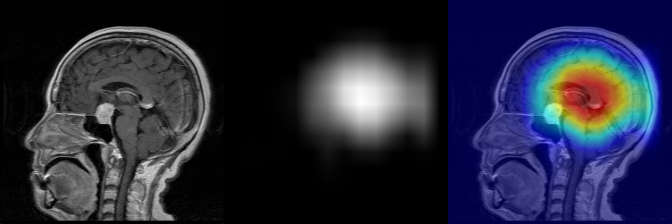

In [ ]:
#pit
#meningimo

image_url = '/content/Brain-Tumor-Classification-DataSet/Testing/pituitary_tumor/image(30).jpg'
img = np.array(Image.open(image_url))
img = cv2.resize(img, (224, 224))
img = np.float32(img) / 255
input_tensor = preprocess_image(img, mean=[0.485, 0.456, 0.406], std=[0.229, 0.224, 0.225])
model.eval()
target_layers = [model.conv_block5]
targets = [ClassifierOutputTarget(2)]

with GradCAM(model=model, target_layers=target_layers) as cam:
    grayscale_cams = cam(input_tensor=input_tensor, targets=targets)
    cam_image = show_cam_on_image(img, grayscale_cams[0, :], use_rgb=True)
cam = np.uint8(255*grayscale_cams[0, :])

cam = cv2.merge([cam, cam, cam])
images = np.hstack((np.uint8(255*img), cam , cam_image))
Image.fromarray(images)

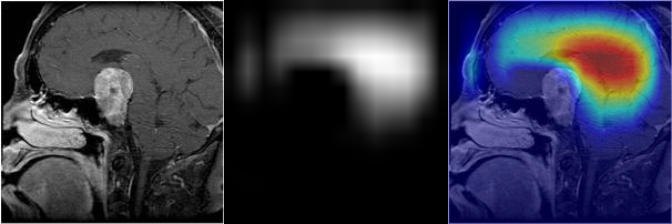

In [ ]:
#pit
#meningimo

image_url = '/content/Brain-Tumor-Classification-DataSet/Testing/pituitary_tumor/image(63).jpg'
img = np.array(Image.open(image_url))
img = cv2.resize(img, (224, 224))
img = np.float32(img) / 255
input_tensor = preprocess_image(img, mean=[0.485, 0.456, 0.406], std=[0.229, 0.224, 0.225])
model.eval()
target_layers = [model.conv_block5]
targets = [ClassifierOutputTarget(2)]

with GradCAM(model=model, target_layers=target_layers) as cam:
    grayscale_cams = cam(input_tensor=input_tensor, targets=targets)
    cam_image = show_cam_on_image(img, grayscale_cams[0, :], use_rgb=True)
cam = np.uint8(255*grayscale_cams[0, :])

cam = cv2.merge([cam, cam, cam])
images = np.hstack((np.uint8(255*img), cam , cam_image))
Image.fromarray(images)

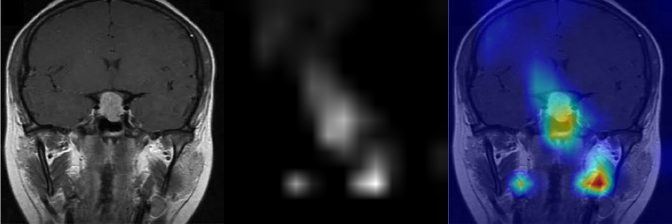

In [ ]:
#pit
#meningimo

image_url = '/content/Brain-Tumor-Classification-DataSet/Testing/pituitary_tumor/image(66).jpg'
img = np.array(Image.open(image_url))
img = cv2.resize(img, (224, 224))
img = np.float32(img) / 255
input_tensor = preprocess_image(img, mean=[0.485, 0.456, 0.406], std=[0.229, 0.224, 0.225])
model.eval()
target_layers = [model.conv_block5]
targets = [ClassifierOutputTarget(1)]

with GradCAM(model=model, target_layers=target_layers) as cam:
    grayscale_cams = cam(input_tensor=input_tensor, targets=targets)
    cam_image = show_cam_on_image(img, grayscale_cams[0, :], use_rgb=True)
cam = np.uint8(255*grayscale_cams[0, :])

cam = cv2.merge([cam, cam, cam])
images = np.hstack((np.uint8(255*img), cam , cam_image))
Image.fromarray(images)

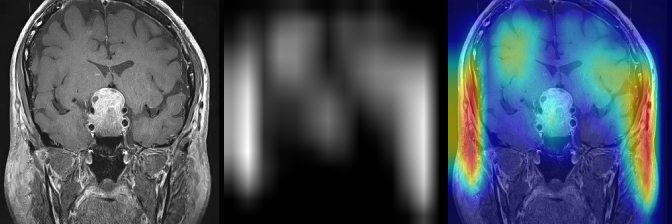

In [ ]:
#pit
#meningimo

image_url = '/content/Brain-Tumor-Classification-DataSet/Testing/pituitary_tumor/image(98).jpg'
img = np.array(Image.open(image_url))
img = cv2.resize(img, (224, 224))
img = np.float32(img) / 255
input_tensor = preprocess_image(img, mean=[0.485, 0.456, 0.406], std=[0.229, 0.224, 0.225])
model.eval()
target_layers = [model.conv_block5[-1]]
targets = [ClassifierOutputTarget(2)]

with GradCAM(model=model, target_layers=target_layers) as cam:
    grayscale_cams = cam(input_tensor=input_tensor, targets=targets)
    cam_image = show_cam_on_image(img, grayscale_cams[0, :], use_rgb=True)
cam = np.uint8(255*grayscale_cams[0, :])

cam = cv2.merge([cam, cam, cam])
images = np.hstack((np.uint8(255*img), cam , cam_image))
Image.fromarray(images)

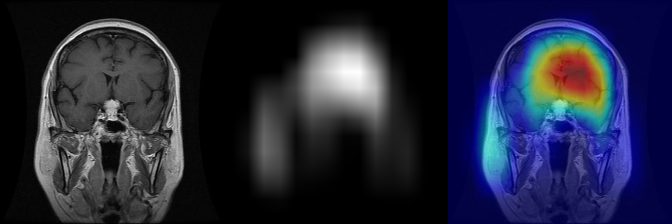

In [ ]:
#pit
#meningimo

image_url = '/content/Brain-Tumor-Classification-DataSet/Testing/pituitary_tumor/image.jpg'
img = np.array(Image.open(image_url))
img = cv2.resize(img, (224, 224))
img = np.float32(img) / 255
input_tensor = preprocess_image(img, mean=[0.485, 0.456, 0.406], std=[0.229, 0.224, 0.225])
model.eval()
target_layers = [model.conv_block5[-1]]
targets = [ClassifierOutputTarget(2)]

with GradCAM(model=model, target_layers=target_layers) as cam:
    grayscale_cams = cam(input_tensor=input_tensor, targets=targets)
    cam_image = show_cam_on_image(img, grayscale_cams[0, :], use_rgb=True)
cam = np.uint8(255*grayscale_cams[0, :])

cam = cv2.merge([cam, cam, cam])
images = np.hstack((np.uint8(255*img), cam , cam_image))
Image.fromarray(images)

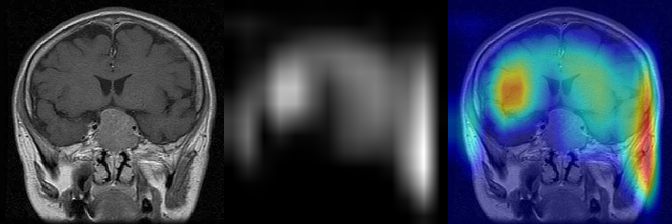

In [ ]:
#pit
#meningimo

image_url = '/content/Brain-Tumor-Classification-DataSet/Testing/pituitary_tumor/image(94).jpg'
img = np.array(Image.open(image_url))
img = cv2.resize(img, (224, 224))
img = np.float32(img) / 255
input_tensor = preprocess_image(img, mean=[0.485, 0.456, 0.406], std=[0.229, 0.224, 0.225])

target_layers = [model.conv_block5[-1]]
targets = [ClassifierOutputTarget(2)]

with GradCAM(model=model, target_layers=target_layers) as cam:
    grayscale_cams = cam(input_tensor=input_tensor, targets=targets)
    cam_image = show_cam_on_image(img, grayscale_cams[0, :], use_rgb=True)
cam = np.uint8(255*grayscale_cams[0, :])

cam = cv2.merge([cam, cam, cam])
images = np.hstack((np.uint8(255*img), cam , cam_image))
Image.fromarray(images)

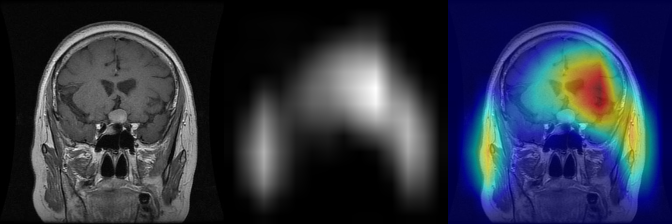

In [ ]:
#pit
#meningimo

image_url = '/content/Brain-Tumor-Classification-DataSet/Training/pituitary_tumor/p (103).jpg'
img = np.array(Image.open(image_url))
img = cv2.resize(img, (224, 224))
img = np.float32(img) / 255
input_tensor = preprocess_image(img, mean=[0.485, 0.456, 0.406], std=[0.229, 0.224, 0.225])

target_layers = [model.conv_block5]
targets = [ClassifierOutputTarget(2)]

with GradCAMPlusPlus(model=model, target_layers=target_layers) as cam:
    grayscale_cams = cam(input_tensor=input_tensor, targets=targets)
    cam_image = show_cam_on_image(img, grayscale_cams[0, :], use_rgb=True)
cam = np.uint8(255*grayscale_cams[0, :])

cam = cv2.merge([cam, cam, cam])
images = np.hstack((np.uint8(255*img), cam , cam_image))
Image.fromarray(images)

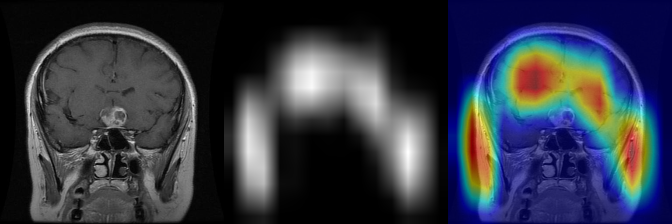

In [ ]:
#pit
#meningimo

image_url = '/content/Brain-Tumor-Classification-DataSet/Training/pituitary_tumor/p (108).jpg'
img = np.array(Image.open(image_url))
img = cv2.resize(img, (224, 224))
img = np.float32(img) / 255
input_tensor = preprocess_image(img, mean=[0.485, 0.456, 0.406], std=[0.229, 0.224, 0.225])

target_layers = [model.conv_block5]
targets = [ClassifierOutputTarget(2)]

with GradCAMPlusPlus(model=model, target_layers=target_layers) as cam:
    grayscale_cams = cam(input_tensor=input_tensor, targets=targets)
    cam_image = show_cam_on_image(img, grayscale_cams[0, :], use_rgb=True)
cam = np.uint8(255*grayscale_cams[0, :])

cam = cv2.merge([cam, cam, cam])
images = np.hstack((np.uint8(255*img), cam , cam_image))
Image.fromarray(images)

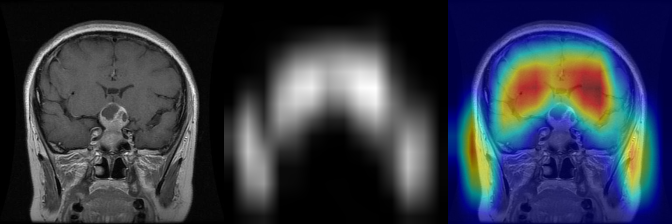

In [ ]:
#pit
#meningimo

image_url = '/content/Brain-Tumor-Classification-DataSet/Training/pituitary_tumor/p (109).jpg'
img = np.array(Image.open(image_url))
img = cv2.resize(img, (224, 224))
img = np.float32(img) / 255
input_tensor = preprocess_image(img, mean=[0.485, 0.456, 0.406], std=[0.229, 0.224, 0.225])

target_layers = [model.conv_block5]
targets = [ClassifierOutputTarget(2)]

with GradCAMPlusPlus(model=model, target_layers=target_layers) as cam:
    grayscale_cams = cam(input_tensor=input_tensor, targets=targets)
    cam_image = show_cam_on_image(img, grayscale_cams[0, :], use_rgb=True)
cam = np.uint8(255*grayscale_cams[0, :])

cam = cv2.merge([cam, cam, cam])
images = np.hstack((np.uint8(255*img), cam , cam_image))
Image.fromarray(images)

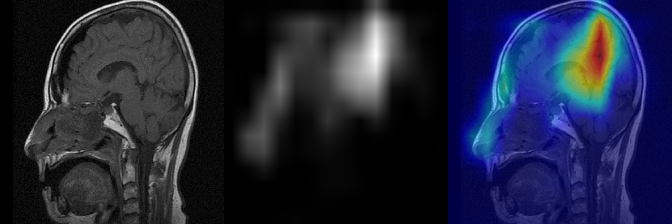

In [ ]:
#pit
#meningimo

image_url = '/content/Brain-Tumor-Classification-DataSet/Training/pituitary_tumor/p (139).jpg'
img = np.array(Image.open(image_url))
img = cv2.resize(img, (224, 224))
img = np.float32(img) / 255
input_tensor = preprocess_image(img, mean=[0.485, 0.456, 0.406], std=[0.229, 0.224, 0.225])

target_layers = [model.conv_block5]
targets = [ClassifierOutputTarget(2)]

with GradCAMPlusPlus(model=model, target_layers=target_layers) as cam:
    grayscale_cams = cam(input_tensor=input_tensor, targets=targets)
    cam_image = show_cam_on_image(img, grayscale_cams[0, :], use_rgb=True)
cam = np.uint8(255*grayscale_cams[0, :])

cam = cv2.merge([cam, cam, cam])
images = np.hstack((np.uint8(255*img), cam , cam_image))
Image.fromarray(images)

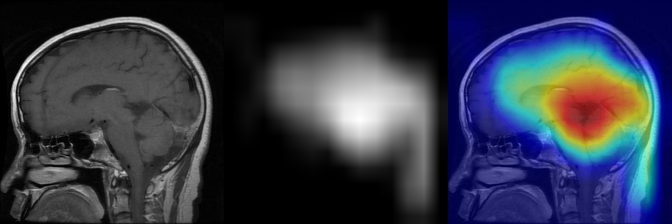

In [ ]:
#pit
#meningimo

image_url = '/content/Brain-Tumor-Classification-DataSet/Training/pituitary_tumor/p (141).jpg'
img = np.array(Image.open(image_url))
img = cv2.resize(img, (224, 224))
img = np.float32(img) / 255
input_tensor = preprocess_image(img, mean=[0.485, 0.456, 0.406], std=[0.229, 0.224, 0.225])

target_layers = [model.conv_block5]
targets = [ClassifierOutputTarget(2)]

with GradCAMPlusPlus(model=model, target_layers=target_layers) as cam:
    grayscale_cams = cam(input_tensor=input_tensor, targets=targets)
    cam_image = show_cam_on_image(img, grayscale_cams[0, :], use_rgb=True)
cam = np.uint8(255*grayscale_cams[0, :])

cam = cv2.merge([cam, cam, cam])
images = np.hstack((np.uint8(255*img), cam , cam_image))
Image.fromarray(images)

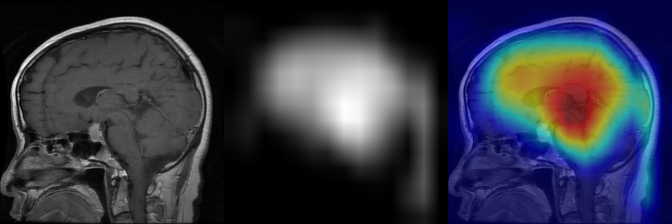

In [ ]:
#pit
#meningimo

image_url = '/content/Brain-Tumor-Classification-DataSet/Training/pituitary_tumor/p (142).jpg'
img = np.array(Image.open(image_url))
img = cv2.resize(img, (224, 224))
img = np.float32(img) / 255
input_tensor = preprocess_image(img, mean=[0.485, 0.456, 0.406], std=[0.229, 0.224, 0.225])

target_layers = [model.conv_block5]
targets = [ClassifierOutputTarget(2)]

with GradCAMPlusPlus(model=model, target_layers=target_layers) as cam:
    grayscale_cams = cam(input_tensor=input_tensor, targets=targets)
    cam_image = show_cam_on_image(img, grayscale_cams[0, :], use_rgb=True)
cam = np.uint8(255*grayscale_cams[0, :])

cam = cv2.merge([cam, cam, cam])
images = np.hstack((np.uint8(255*img), cam , cam_image))
Image.fromarray(images)

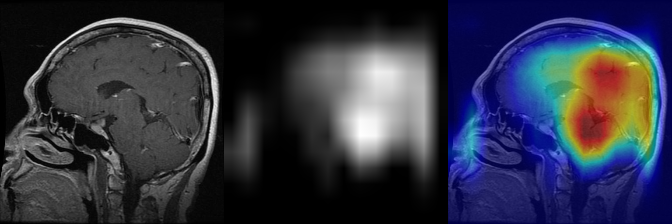

In [ ]:
#pit
#meningimo

image_url = '/content/Brain-Tumor-Classification-DataSet/Training/pituitary_tumor/p (159).jpg'
img = np.array(Image.open(image_url))
img = cv2.resize(img, (224, 224))
img = np.float32(img) / 255
input_tensor = preprocess_image(img, mean=[0.485, 0.456, 0.406], std=[0.229, 0.224, 0.225])

target_layers = [model.conv_block5]
targets = [ClassifierOutputTarget(2)]

with GradCAMPlusPlus(model=model, target_layers=target_layers) as cam:
    grayscale_cams = cam(input_tensor=input_tensor, targets=targets)
    cam_image = show_cam_on_image(img, grayscale_cams[0, :], use_rgb=True)
cam = np.uint8(255*grayscale_cams[0, :])

cam = cv2.merge([cam, cam, cam])
images = np.hstack((np.uint8(255*img), cam , cam_image))
Image.fromarray(images)